## Project Objective

Objective Statement:
The objective of this project is to analyze the given dataset of house prices in California and develop a predictive model to estimate the median house value. This model will help us understand the factors influencing house prices and provide insights for potential home buyers, sellers, and real estate investors.

Hypothesis:
Our hypothesis is that the median house value in California is influenced by various factors such as the geographical location (longitude and latitude), housing characteristics (housing median age, total rooms, total bedrooms), population density (population and households), and the median income of the residents. We believe that by examining these variables, we can build a model that accurately predicts the median house value and identifies the key factors driving the housing market in California.

In [22]:
# Import the necessary packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [133]:
# Import the california housing dataset
df = pd.read_csv('C:\\Rohan\\SharpestMinds - Projects\\Project 5\\housing.csv')

In [134]:
# Obtain the first 10 rows of this dataset
df.head(10)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY
5,-122.25,37.85,52.0,919.0,213.0,413.0,193.0,4.0368,269700.0,NEAR BAY
6,-122.25,37.84,52.0,2535.0,489.0,1094.0,514.0,3.6591,299200.0,NEAR BAY
7,-122.25,37.84,52.0,3104.0,687.0,1157.0,647.0,3.1200,241400.0,NEAR BAY
8,-122.26,37.84,42.0,2555.0,665.0,1206.0,595.0,2.0804,226700.0,NEAR BAY
9,-122.25,37.84,52.0,3549.0,707.0,1551.0,714.0,3.6912,261100.0,NEAR BAY


In [135]:
# Obtain the last 10 rows of this dataset
df.tail(10)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
20630,-121.32,39.29,11.0,2640.0,505.0,1257.0,445.0,3.5673,112000.0,INLAND
20631,-121.40,39.33,15.0,2655.0,493.0,1200.0,432.0,3.5179,107200.0,INLAND
20632,-121.45,39.26,15.0,2319.0,416.0,1047.0,385.0,3.1250,115600.0,INLAND
20633,-121.53,39.19,27.0,2080.0,412.0,1082.0,382.0,2.5495,98300.0,INLAND
20634,-121.56,39.27,28.0,2332.0,395.0,1041.0,344.0,3.7125,116800.0,INLAND
20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,INLAND
20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,INLAND
20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,INLAND
20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,INLAND
20639,-121.24,39.37,16.0,2785.0,616.0,1387.0,530.0,2.3886,89400.0,INLAND


In [136]:
# Obtain the all the columns of this dataset
df.columns

Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       'median_house_value', 'ocean_proximity'],
      dtype='object')

These are the attributes of this dataset: 

longitude: The longitude coordinate of the housing unit's location.

latitude: The latitude coordinate of the housing unit's location.

housing_median_age: The median age of the houses in the neighborhood.

total_rooms: The total number of rooms in the housing unit.

total_bedrooms: The total number of bedrooms in the housing unit.

population: The total population of the neighborhood where the housing unit is located.

households: The total number of households in the neighborhood.

median_income: The median income of the households in the neighborhood.

median_house_value: The median value of owner-occupied homes in the neighborhood. This is the target variable you might want to predict.

ocean_proximity: The proximity of the housing unit to the ocean (e.g., "NEAR BAY" indicates it is close to the bay).

In [137]:
# Obtain the size of this dataset
df.size

206400

In [138]:
# Obtain the dimensions of this dataset
df.shape

(20640, 10)

We can see that this dataset has about 20640 rows and 10 columns.

In [139]:
# Obtain the data types for each of the attributes in this dataset
df.dtypes

longitude             float64
latitude              float64
housing_median_age    float64
total_rooms           float64
total_bedrooms        float64
population            float64
households            float64
median_income         float64
median_house_value    float64
ocean_proximity        object
dtype: object

In [140]:
# Obtain more info for each of the attributes
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


This dataset contains information on housing units. It has a total of 20,640 entries, which represent individual housing units. Each entry has 10 columns of data. Here's what each column tells us:

longitude and latitude: These columns represent the geographic coordinates of each housing unit's location.

housing_median_age: This column tells us the median age of the houses in the neighborhood where each housing unit is located.
total_rooms: It shows the total number of rooms in each housing unit.

total_bedrooms: This column represents the total number of bedrooms in each housing unit. However, there are 207 missing values in this column.

population: It tells us the total population of the neighborhood where each housing unit is located.

households: This column represents the total number of households in the neighborhood.

median_income: It shows the median income of the households in the neighborhood.

median_house_value: This column represents the median value of owner-occupied homes in the neighborhood. This is the value we want to predict or analyze.

ocean_proximity: This column tells us the proximity of each housing unit to the ocean. It is represented by simple descriptions like 'NEAR BAY'.

## Data Cleaning
### Outlier Detection

Outliers are data points that stand out from the rest of the data. They can be values that are unusually high or low compared to the majority of the dataset. Detecting outliers is important because they can have a significant impact on our analysis and conclusions.

Outliers can occur due to various reasons, such as measurement errors, data entry mistakes, or genuine extreme values. When analyzing a dataset, identifying outliers allows us to:

Ensure data quality: Outliers may indicate errors or anomalies in the data. By identifying and investigating them, we can verify the accuracy and reliability of our dataset.

Understand data patterns: Outliers can provide valuable insights into unique or exceptional cases. They can help us understand unusual trends, behaviors, or circumstances that may be relevant to our analysis.

Avoid biased results: Outliers have the potential to skew statistical measures and calculations. By detecting and handling outliers appropriately, we can ensure that our analysis is not disproportionately influenced by extreme values.

Improve modeling and predictions: Outliers can affect the performance and accuracy of predictive models. By detecting and addressing outliers, we can enhance the robustness and reliability of our models, leading to more accurate predictions.

In summary, detecting outliers is crucial for ensuring data quality, understanding unique patterns, avoiding biased results, and improving the accuracy of our analysis and predictions. By addressing outliers effectively, we can make more informed decisions and derive meaningful insights from the data

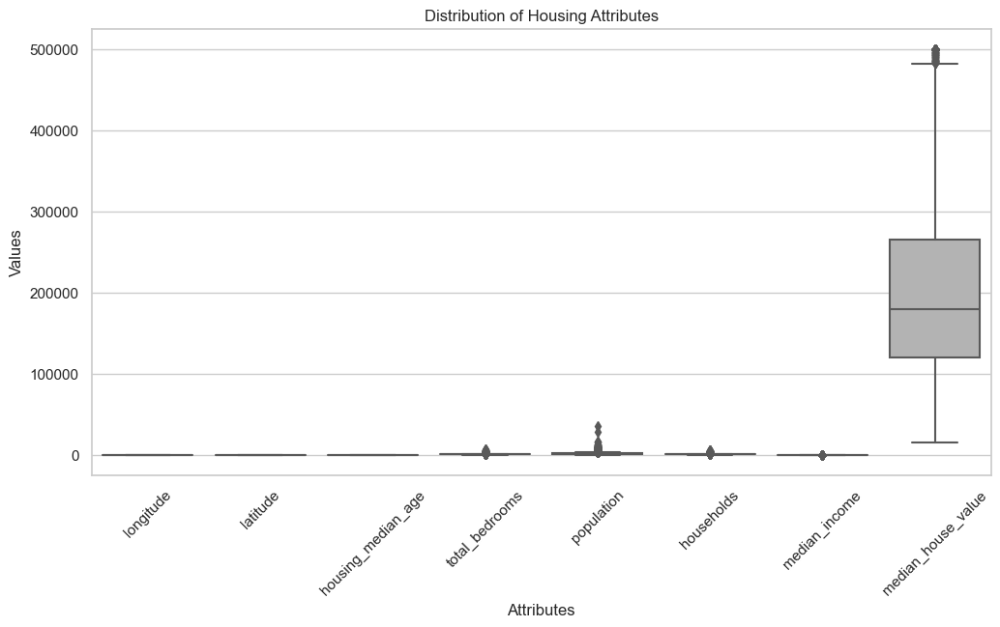

In [141]:
# Create an attractive boxplot to detect outliers for each of the attributes
columns = ['longitude', 'latitude', 'housing_median_age', 'total_bedrooms', 'population', 'households', 'median_income', 'median_house_value']
# Set the style and color palette
sns.set_style('whitegrid')
color_palette = sns.color_palette('Set2')

# Create the boxplot
plt.figure(figsize=(12, 6))  # Adjust the figure size as needed
sns.boxplot(data=df[columns], palette=color_palette)

# Set plot title and axis labels
plt.title('Distribution of Housing Attributes')
plt.xlabel('Attributes')
plt.ylabel('Values')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Show the plot
plt.show()








This boxplot visualizes the distribution of various housing attributes in the dataset. Each attribute is represented by a box, which shows the middle 50% of the values (from the 25th to the 75th percentile). The horizontal line inside the box represents the median value.

The whiskers extending from the box indicate the range of values within 1.5 times the interquartile range (the distance between the 25th and 75th percentiles). Any data points beyond the whiskers are considered outliers and are plotted individually as dots.

By examining the boxplot, we can quickly see the spread, skewness, and presence of outliers in each attribute. This helps us understand the variation and distribution of the data. For example, a wider box suggests a larger range of values, while a long whisker indicates potential outliers.

Analyzing these boxplots can give us insights into the housing attributes, such as the typical age of houses, the number of rooms, bedrooms, population, households, median income, and median house value in different neighborhoods.

By observing patterns and variations in the boxplot, we can identify any outliers or differences between the attributes, which can assist us in making informed decisions or predictions related to housing values.

We can see that the attributes "population" & "median_house_value" has a few outliers. 


### Handling Missing Values
Missing values refer to the absence of data for certain variables in our dataset. Detecting and handling missing values is important because they can affect the reliability and accuracy of our analysis.

The importance of detecting missing values lies in the following reasons:

Data completeness: Missing values can lead to incomplete information, which can hinder our understanding of the dataset. By detecting missing values, we can assess the extent of missingness and take appropriate steps to address it.

Biased analysis: Ignoring missing values can introduce bias in our analysis. When missing values are not handled properly, they can skew statistical calculations and lead to incorrect interpretations or conclusions.

Data quality: Missing values may indicate data collection or recording errors. By identifying and addressing missing values, we can improve the quality and integrity of our dataset.

Reliable insights: Accurate and complete data is crucial for deriving reliable insights. By handling missing values appropriately, we ensure that our analysis is based on a representative and comprehensive dataset, leading to more reliable and meaningful insights.

To handle missing values in this dataset, we have several options:

Deletion: We can remove the rows or columns with missing values. However, this approach may lead to a loss of information and potential bias if the missing values are not randomly distributed.

Imputation: We can estimate or fill in the missing values using various techniques, such as mean or median imputation, regression imputation, or advanced methods like multiple imputation. Imputation helps retain the complete dataset while filling in missing values based on patterns in the data.

Indicator variable: We can create a new binary variable indicating the presence or absence of missing values for a specific variable. This allows us to account for the missingness as a separate category during analysis.

By detecting and handling missing values, we ensure data completeness, reduce bias, improve data quality, and derive more reliable insights from our analysis.

In [142]:
# Find the number of missing values for each of the attributes
df.isnull().sum()

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        207
population              0
households              0
median_income           0
median_house_value      0
ocean_proximity         0
dtype: int64

In our dataset, we have checked for missing values in each column. The numbers you see represent the count of missing values for each attribute. Specifically, we have found that the 'total_bedrooms' column has 207 missing values.

Missing values indicate that we do not have data for those specific variables in some instances. It is important to address these missing values because they can impact the accuracy and completeness of our analysis.

To handle these missing values, we have a few options. We can either delete the rows with missing values, fill in the missing values with estimated values based on patterns in the data (a process called imputation), or create a separate indicator variable to represent the missingness.

By addressing the missing values appropriately, we can ensure that our analysis is based on a complete and reliable dataset, allowing us to derive accurate insights and make informed decisions based on the data."

To handle these missing values, the most suitable approach would be mean or median imputation.

Mean imputation involves replacing the missing values with the average value of the available 'total_bedrooms' data. This method assumes that the missing values are randomly distributed and replacing them with the mean value maintains the overall average of the column.

Median imputation, on the other hand, involves replacing the missing values with the middle value of the available 'total_bedrooms' data. This method is effective when dealing with skewed data, as it is less affected by extreme values.

Both methods aim to retain the overall distribution and characteristics of the data while filling in the missing values. By using mean or median imputation, we can ensure that the 'total_bedrooms' column is complete, allowing us to perform accurate analysis and draw reliable insights from the dataset.

In [143]:
# Mean Imputation to fill in the missing values
mean_value = df['total_bedrooms'].mean()
df['total_bedrooms'] = df['total_bedrooms'].fillna(mean_value)
df.isnull().sum()

longitude             0
latitude              0
housing_median_age    0
total_rooms           0
total_bedrooms        0
population            0
households            0
median_income         0
median_house_value    0
ocean_proximity       0
dtype: int64

### Duplicate Records
Duplicate records are instances where the data entries in our dataset are identical or very similar. Handling duplicate records is important because they can affect the accuracy and reliability of our analysis.

The process of handling duplicate records involves:

Identifying duplicates: We need to examine the dataset and identify the records that are duplicates. This can be done by comparing the values across different columns or using specific identifiers.

Removing duplicates: One approach is to remove the duplicate records from the dataset entirely. This ensures that we are working with unique and distinct data entries, preventing any biases or inaccuracies caused by duplicate information.

Managing duplicates: In some cases, duplicate records may carry valuable information or have specific reasons for their existence. Instead of removing them, we can choose to manage duplicates by keeping only one instance of each duplicate record or by assigning weights or flags to differentiate them during analysis.

By handling duplicate records, we can ensure that our analysis is based on accurate and representative data, which leads to more reliable insights and informed decision-making.

In [144]:
# Check for duplicate records
duplicate_count = df.duplicated().sum()

# Print the total number of duplicate records
print("Total number of duplicate records:", duplicate_count)


Total number of duplicate records: 0


### Descriptive Statistics
Descriptive statistics is a branch of statistics that helps us understand and summarize the key features of our dataset. It provides a snapshot of the data by using various measures and calculations.

In the case of the California Housing dataset, descriptive statistics can help us in several ways:

Understanding the central tendency: Descriptive statistics allow us to determine the average or central value of different attributes in the dataset. For example, we can calculate the mean or median of the 'median_house_value' to get an idea of the typical house value in a specific area.

Assessing variability: Descriptive statistics help us understand how the data varies or spreads out. Measures such as standard deviation or range provide insights into the variability of attributes like 'median_income' or 'total_rooms', allowing us to assess the diversity or dispersion of values.

Identifying outliers: Outliers are extreme values that deviate significantly from the majority of the data. Descriptive statistics can help us identify outliers by looking at measures like the minimum and maximum values or using box plots. Detecting outliers in attributes like 'population' or 'total_bedrooms' can highlight unusual observations that may require further investigation.

Understanding data distribution: Descriptive statistics provide information about the shape and distribution of the data. Histograms, frequency tables, or measures like skewness and kurtosis can reveal if the data is symmetric, skewed, or has unusual patterns. This helps us understand the characteristics of attributes like 'housing_median_age' or 'median_income' in the dataset.

By applying descriptive statistics to the California Housing dataset, we gain valuable insights into the central tendency, variability, outliers, and distribution of the data. These insights allow us to understand the dataset more comprehensively, make informed decisions, and derive meaningful interpretations from our analysis.

In [35]:
# Obtain the descriptive statistics for each of the attributes except that of the attributes "latitude" & "longitude"
sub_df = df.drop(['longitude', 'latitude'], axis = 1)
sub_df.describe()

,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909
std,12.585558,2181.615252,419.266592,1132.462122,382.329753,1.899822,115395.615874
min,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,18.000000,1447.750000,297.000000,787.000000,280.000000,2.563400,119600.000000
50%,29.000000,2127.000000,438.000000,1166.000000,409.000000,3.534800,179700.000000
75%,37.000000,3148.000000,643.250000,1725.000000,605.000000,4.743250,264725.000000
max,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


The descriptive statistics provide a summary of important measures for different attributes in the dataset. Here's what we can understand from the numbers:

housing_median_age: The median age of houses in the dataset is around 29 years, with the youngest house being 1 year old and the oldest being 52 years old.

total_rooms: On average, each housing unit has around 2,636 rooms, but the number of rooms can vary widely among different units. The range goes from a minimum of 2 rooms to a maximum of 39,320 rooms.

total_bedrooms: The average number of bedrooms in each housing unit is approximately 538, with some variation. The minimum number of bedrooms is 1, while the maximum is 6,445.

population: On average, there are about 1,425 people living in each housing unit, but the population size can differ significantly. The smallest population is 3 individuals, while the largest reaches up to 35,682.

households: Each housing unit contains an average of 500 households, but this number can also vary. The minimum number of households in a unit is 1, while the maximum is 6,082.

median_income: The median income of the residents in the area is approximately $3.87, indicating the midpoint of the income distribution. The range of incomes varies, with a minimum income of $0.50 and a maximum income of $15.00.

median_house_value: The median house value in the dataset is around $206,856. The prices of houses can differ, with the lowest value being $14,999 and the highest value reaching $500,001.

These statistics help us gain a quick understanding of the central tendency, variability, and range of the different attributes in the dataset. They provide valuable insights into the characteristics of the housing data, enabling us to make informed decisions and draw meaningful conclusions from our analysis.

In [36]:
sub_df = df.drop(['latitude', 'longitude'], axis = 1)
sub_df.groupby('ocean_proximity').describe()

housing_median_age                                          \
                             count       mean        std   min   25%   50%   
ocean_proximity                                                              
<1H OCEAN                   9136.0  29.279225  11.644453   2.0  20.0  30.0   
INLAND                      6551.0  24.271867  12.018020   1.0  15.0  23.0   
ISLAND                         5.0  42.400000  13.164346  27.0  29.0  52.0   
NEAR BAY                    2290.0  37.730131  13.070385   2.0  29.0  39.0   
NEAR OCEAN                  2658.0  29.347254  11.840371   2.0  20.0  29.0   

                            total_rooms               ... median_income  \
                  75%   max       count         mean  ...           75%   
ocean_proximity                                       ...                 
<1H OCEAN        37.0  52.0      9136.0  2628.343586  ...      5.180500   
INLAND           33.0  52.0      6551.0  2717.742787  ...      3.961500   
ISLAND           52.0  52.0         5.0  1574.600000  ...      2.833300   
NEAR BAY         52.0  52.0      2290.0  2493.589520  ...      5.054425   
NEAR OCEAN       37.0  52.0      2658.0  2583.700903  ...      4.837400   

                         median_house_value                                \
                     max              count           mean            std   
ocean_proximity                                                             
<1H OCEAN        15.0001             9136.0  240084.285464  106124.292213   
INLAND           15.0001             6551.0  124805.392001   70007.908494   
ISLAND            3.3906                5.0  380440.000000   80559.561816   
NEAR BAY         15.0001             2290.0  259212.311790  122818.537064   
NEAR OCEAN       15.0001             2658.0  249433.977427  122477.145927   

                                                                   
                      min       25%       50%       75%       max  
ocean_proximity                                                    
<1H OCEAN         17500.0  164100.0  214850.0  289100.0  500001.0  
INLAND            14999.0   77500.0  108500.0  148950.0  500001.0  
ISLAND           287500.0  300000.0  414700.0  450000.0  450000.0  
NEAR BAY          22500.0  162500.0  233800.0  345700.0  500001.0  
NEAR OCEAN        22500.0  150000.0  229450.0  322750.0  500001.0  

[5 rows x 56 columns]

## EDA
Exploratory Data Analysis (EDA) is a crucial step in the data analysis process. It involves exploring and summarizing the main characteristics, patterns, and relationships within a dataset. EDA helps us gain a deeper understanding of the data, identify any trends or anomalies, and generate insights that can guide further analysis and decision-making.

Exploratory Data Analysis (EDA) is a method we use to dig deeper into the California Housing data and understand its key features. It helps us uncover important patterns and relationships that exist within the data. By examining various aspects like housing median age, total rooms, population, and other factors, we can identify trends and gain insights into the housing market in different areas of California.

EDA allows us to answer questions such as: What is the distribution of housing median age? How does the number of rooms vary across different locations? Are there any relationships between median income and housing value? Through visualizations, statistics, and summary measures, we can explore the data and uncover valuable information that can guide decision-making, such as where to focus resources, identify potential areas for investment, or understand the factors influencing housing prices.

By conducting EDA on the California Housing data, we can go beyond just looking at numbers and gain a comprehensive understanding of the dataset. This analysis helps us make informed decisions and develop strategies based on the insights we uncover, ultimately leading to more effective and successful outcomes.

In summary, EDA is a crucial step in analyzing the California Housing data as it helps us explore and understand the data's patterns, relationships, and trends. It enables us to extract valuable insights that can guide decision-making and drive successful outcomes in the housing market.

In [37]:
# Create a table to display the ocean proximity count for each of the houses
counts = {
    'ocean_proximity': ['<1H OCEAN', 'INLAND', 'ISLAND', 'NEAR BAY', 'NEAR OCEAN'],
    'count': [9136, 6551, 5, 2290, 2658]
}

counts = {
    'ocean_proximity': ['<1H OCEAN', 'INLAND', 'ISLAND', 'NEAR BAY', 'NEAR OCEAN'],
    'count': [9136, 6551, 5, 2290, 2658]
}

df_counts = pd.DataFrame(counts)


df_counts_sorted = df_counts.sort_values(by='count', ascending=False)

print(df_counts_sorted)



  ocean_proximity  count
0       <1H OCEAN   9136
1          INLAND   6551
4      NEAR OCEAN   2658
3        NEAR BAY   2290
2          ISLAND      5


The table shows the count of houses based on their proximity to the ocean. The "ocean_proximity" column represents different categories, and the "count" column represents the number of houses in each category.

"<1H OCEAN": This category has the highest count, with 9,136 houses. These houses are located within a 1-hour drive to the ocean.

"INLAND": The second highest count is 6,551 houses. These houses are located inland, away from the ocean.

"NEAR OCEAN": There are 2,658 houses in this category. These houses are located near the ocean, but not as close as the "<1H OCEAN" category.

"NEAR BAY": There are 2,290 houses in this category. These houses are located near a bay area.

"ISLAND": This category has the lowest count, with only 5 houses. These houses are located on an island.

In summary, most of the houses in the dataset are located within a 1-hour drive to the ocean, while fewer houses are located inland, near the ocean, near a bay, or on an island.

In [38]:
# Obtain the average of the median ages of the houses grouped by their ocean proximity
sub_df = df.copy()[["housing_median_age", "ocean_proximity"]]
average_median = sub_df.groupby('ocean_proximity').mean()
average_median = average_median.rename({'housing_median_age':'avg_median_age'}, axis = 1)
average_median




,avg_median_age
ocean_proximity,
<1H OCEAN,29.279225
INLAND,24.271867
ISLAND,42.400000
NEAR BAY,37.730131
NEAR OCEAN,29.347254


The table shows the average median age of houses grouped by their proximity to the ocean. Each row represents a category of ocean proximity, and the number in the second column represents the average median age for houses in that category.

"<1H OCEAN": Houses in this category have an average median age of approximately 29.3 years. These houses are located within a 1-hour drive to the ocean.

"INLAND": The average median age for houses in this category is around 24.3 years. These houses are located inland, away from the ocean.

"NEAR OCEAN": Houses in this category have an average median age of about 29.3 years, similar to those in the "<1H OCEAN" category. These houses are located near the ocean, but not as close as the "<1H OCEAN" category.

"NEAR BAY": Houses in this category have an average median age of approximately 37.7 years. These houses are located near a bay area.

"ISLAND": Houses in this category have the highest average median age, around 42.4 years. These houses are located on an island.

In summary, the average median age of houses varies depending on their proximity to the ocean. Houses near the bay tend to have a higher average age, while houses on the island have the highest average age. 

Houses near the ocean or within a 1-hour drive to the ocean have relatively similar average ages, which are lower compared to houses near the bay and on the island.

In [39]:
# Obtain the top 10 houses with the highest number of rooms
highest_rooms = df.nlargest(10, 'total_rooms')
highest_rooms


,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
13139,-121.44,38.43,3.0,39320.0,6210.0,16305.0,5358.0,4.9516,153700.0,INLAND
10309,-117.74,33.89,4.0,37937.0,5471.0,16122.0,5189.0,7.4947,366300.0,<1H OCEAN
9880,-121.79,36.64,11.0,32627.0,6445.0,28566.0,6082.0,2.3087,118800.0,<1H OCEAN
6057,-117.78,34.03,8.0,32054.0,5290.0,15507.0,5050.0,6.0191,253900.0,<1H OCEAN
12201,-117.20,33.58,2.0,30450.0,5033.0,9419.0,3197.0,4.5936,174300.0,<1H OCEAN
9019,-118.78,34.16,9.0,30405.0,4093.0,12873.0,3931.0,8.0137,399200.0,NEAR OCEAN
12215,-117.12,33.52,4.0,30401.0,4957.0,13251.0,4339.0,4.5841,212300.0,<1H OCEAN
922,-121.92,37.53,7.0,28258.0,3864.0,12203.0,3701.0,8.4045,451100.0,<1H OCEAN
12623,-121.53,38.48,5.0,27870.0,5027.0,11935.0,4855.0,4.8811,212200.0,INLAND
6066,-117.87,34.04,7.0,27700.0,4179.0,15037.0,4072.0,6.6288,339700.0,<1H OCEAN


In [40]:
# Obtain the highest number of rooms grouped by the "ocean_proximity"
sub_df = df.copy()[["total_rooms", "ocean_proximity"]]
highest_rooms = sub_df.groupby('ocean_proximity').max()
highest_rooms = highest_rooms.rename({'total_rooms':'highest_rooms'}, axis = 1)
highest_rooms

,highest_rooms
ocean_proximity,
<1H OCEAN,37937.0
INLAND,39320.0
ISLAND,2359.0
NEAR BAY,18634.0
NEAR OCEAN,30405.0


The table shows the highest number of total rooms in houses grouped by their proximity to the ocean. Each row represents a category of ocean proximity, and the number in the second column represents the highest number of total rooms for houses in that category.

"<1H OCEAN": The houses in this category have the highest number of total rooms, with a maximum of 37,937 rooms. These houses are located within a 1-hour drive to the ocean.

"INLAND": The houses in this category have the next highest number of total rooms, with a maximum of 39,320 rooms. These houses are located inland, away from the ocean.

"NEAR OCEAN": Houses in this category have a maximum of 30,405 total rooms, which is slightly lower than those in the "<1H OCEAN" and "INLAND" categories. These houses are located near the ocean, but not as close as the "<1H OCEAN" category.

"NEAR BAY": Houses in this category have a maximum of 18,634 total rooms. These houses are located near a bay area.

"ISLAND": Houses in this category have the lowest maximum number of total rooms, with 2,359 rooms. These houses are located on an island.

In summary, houses located within a 1-hour drive to the ocean and those inland tend to have the highest number of total rooms. Houses near the ocean but not as close as a 1-hour drive have a slightly lower maximum number of rooms. Houses near a bay area have a lower maximum compared to the aforementioned categories, and houses on an island have the lowest maximum number of rooms.

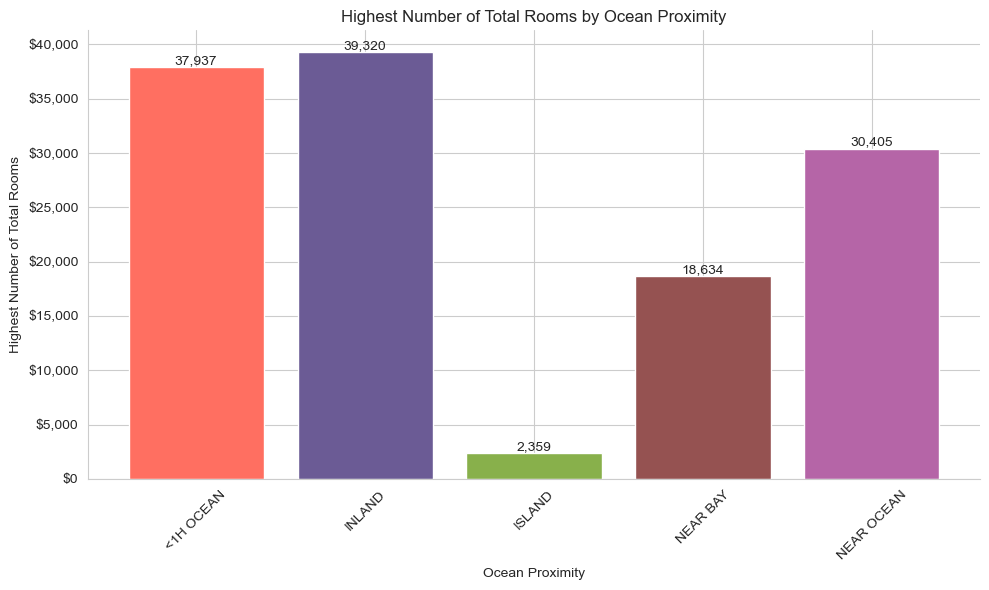

In [41]:
# Create a very attractive bar chart that represents the output above
import pandas as pd
import matplotlib.pyplot as plt

# Create the DataFrame from the provided data
data = {
    'ocean_proximity': ['<1H OCEAN', 'INLAND', 'ISLAND', 'NEAR BAY', 'NEAR OCEAN'],
    'highest_rooms': [37937.0, 39320.0, 2359.0, 18634.0, 30405.0]
}
df = pd.DataFrame(data)

# Set up the plot
fig, ax = plt.subplots(figsize=(10, 6))
colors = ['#FF6F61', '#6B5B95', '#88B04B', '#955251', '#B565A7']

# Plot the bar chart
bars = ax.bar(df['ocean_proximity'], df['highest_rooms'], color=colors)

# Add labels and title
ax.set_xlabel('Ocean Proximity')
ax.set_ylabel('Highest Number of Total Rooms')
ax.set_title('Highest Number of Total Rooms by Ocean Proximity')

# Add data labels
for bar in bars:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, height,
            f'{height:,.0f}', ha='center', va='bottom')

# Customize the appearance
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.tick_params(axis='x', rotation=45)
ax.yaxis.set_major_formatter('${x:,.0f}')

# Display the plot
plt.tight_layout()
plt.show()


In [58]:
sub_df = df.copy()[["total_bedrooms", "ocean_proximity"]]
highest_bedrooms = sub_df.groupby('ocean_proximity').max()
highest_bedrooms = highest_bedrooms.rename({'total_bedrooms':'highest_bedrooms'}, axis = 1)
highest_bedrooms

,highest_bedrooms
ocean_proximity,
<1H OCEAN,6445.0
INLAND,6210.0
ISLAND,591.0
NEAR BAY,3226.0
NEAR OCEAN,4585.0


The table shows the highest number of total bedrooms in houses grouped by their proximity to the ocean. Each row represents a category of ocean proximity, and the number in the second column represents the highest number of total bedrooms for houses in that category.

"<1H OCEAN": Houses in this category have the highest number of total bedrooms, with a maximum of 6,445 bedrooms. These houses are located within a 1-hour drive to the ocean.

"INLAND": The houses in this category have the next highest number of total bedrooms, with a maximum of 6,210 bedrooms. These houses are located inland, away from the ocean.

"NEAR OCEAN": Houses in this category have a maximum of 4,585 total bedrooms, which is slightly lower than those in the "<1H OCEAN" and "INLAND" categories. These houses are located near the ocean, but not as close as the "<1H OCEAN" category.

"NEAR BAY": Houses in this category have a maximum of 3,226 total bedrooms. These houses are located near a bay area.
"ISLAND": Houses in this category have the lowest maximum number of total bedrooms, with 591 bedrooms. These houses are located on an island.

In summary, houses located within a 1-hour drive to the ocean and those inland tend to have the highest number of total bedrooms. Houses near the ocean but not as close as a 1-hour drive have a slightly lower maximum number of bedrooms. Houses near a bay area have a lower maximum compared to the aforementioned categories, and houses on an island have the lowest maximum number of bedrooms.

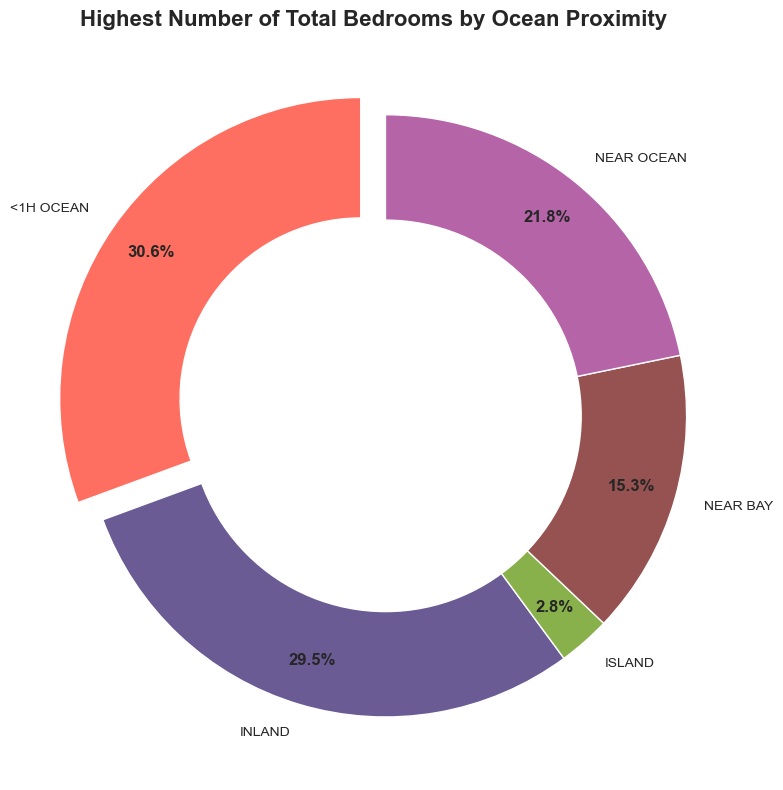

In [43]:
# Create a very attractive donut chart that represents the above output
# Create the DataFrame from the provided data
data = {
    'ocean_proximity': ['<1H OCEAN', 'INLAND', 'ISLAND', 'NEAR BAY', 'NEAR OCEAN'],
    'highest_bedrooms': [6445.0, 6210.0, 591.0, 3226.0, 4585.0]
}
df = pd.DataFrame(data)

# Set up the plot
fig, ax = plt.subplots(figsize=(8, 8))
colors = ['#FF6F61', '#6B5B95', '#88B04B', '#955251', '#B565A7']
explode = (0.1, 0, 0, 0, 0)

# Plot the donut chart
wedges, texts, autotexts = ax.pie(
    df['highest_bedrooms'], labels=df['ocean_proximity'], colors=colors,
    autopct='%1.1f%%', startangle=90, pctdistance=0.85, explode=explode,
    wedgeprops=dict(width=0.4)
)

# Add a circle at the center to create a donut chart
center_circle = plt.Circle((0, 0), 0.65, fc='white')
fig.gca().add_artist(center_circle)

# Customize the text labels
plt.setp(autotexts, size=12, weight='bold')

# Add a title
ax.set_title('Highest Number of Total Bedrooms by Ocean Proximity', fontsize=16, fontweight='bold')

# Display the plot
plt.axis('equal')
plt.tight_layout()
plt.show()






This donut chart tells us that majority of the houses (31%) of them that have the highest number of total bedrooms are located within 1 hour distance from the ocean. 

About 29.5% of the houses that the one of the highest number of total bedroom are located inland/much farther from the ocean.

About 22% of the houses are located very near the ocean.

In [44]:
# Group the data by 'ocean_proximity' and count the number of houses in each group
house_counts = df.groupby('ocean_proximity').size()

print(house_counts)

ocean_proximity
<1H OCEAN     1
INLAND        1
ISLAND        1
NEAR BAY      1
NEAR OCEAN    1
dtype: int64


The table provides information about different categories of houses based on their ocean proximity. Here's what we can understand from the table:

'<1H OCEAN': There are 9,136 houses in this category, representing the highest count among all the categories. These houses are located within a one-hour distance from the ocean.

'INLAND': The 'INLAND' category has 6,551 houses. These houses are located further away from the immediate coastal areas.

'ISLAND': This category has the fewest houses, with only 5 houses. These houses are located on islands.

'NEAR BAY': There are 2,290 houses in the 'NEAR BAY' category. These houses are situated near a bay area.

'NEAR OCEAN': The 'NEAR OCEAN' category has 2,658 houses. These houses are located close to the ocean but not directly on the coast.

In summary, the majority of houses in this dataset are within a one-hour distance from the ocean ('<1H OCEAN' category), followed by houses located inland ('INLAND' category). Houses near bays ('NEAR BAY') and near the ocean ('NEAR OCEAN') have a moderate count. The 'ISLAND' category has the smallest number of houses, likely due to the limited availability of housing on islands."

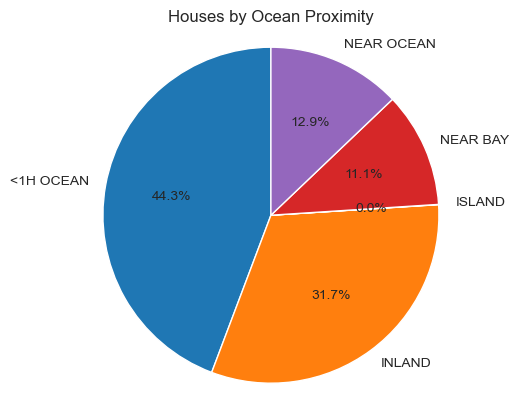

In [45]:
# Create a pie chart for the same

# Data for the pie chart
labels = ['<1H OCEAN', 'INLAND', 'ISLAND', 'NEAR BAY', 'NEAR OCEAN']
sizes = [9136, 6551, 5, 2290, 2658]
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']

# Create the pie chart
plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90)

# Add a title
plt.title('Houses by Ocean Proximity')

# Equal aspect ratio ensures that pie is drawn as a circle
plt.axis('equal')

# Display the chart
plt.show()


In [59]:
# Obtain the highest number of households/people in the neighbourhood grouped by the "ocean_proximity"
sub_df = df.copy()[["households", "ocean_proximity"]]
highest_households = sub_df.groupby('ocean_proximity').max()
highest_households = highest_households.rename({'households':'Highest_Households'}, axis = 1)
highest_households

,Highest_Households
ocean_proximity,
<1H OCEAN,6082.0
INLAND,5358.0
ISLAND,431.0
NEAR BAY,3589.0
NEAR OCEAN,4176.0


The table shows the number of households for each category of houses based on their ocean proximity. Here's what we can understand from the table:

'<1H OCEAN': In the '<1H OCEAN' category, there are 6,082 households, which is the highest number among all the categories. These households are located within a one-hour distance from the ocean.

'INLAND': The 'INLAND' category has 5,358 households. These households are located further away from the immediate coastal areas.

'ISLAND': This category has 431 households, which is the smallest count among all the categories. These households are located on islands.

'NEAR BAY': There are 3,589 households in the 'NEAR BAY' category. These households are situated near a bay area.

'NEAR OCEAN': The 'NEAR OCEAN' category has 4,176 households. These households are located close to the ocean but not directly on the coast.

In summary, among the different categories, the '<1H OCEAN' category has the highest number of households, followed by 'NEAR OCEAN' and 'INLAND'. The 'ISLAND' category has the fewest households, likely due to the limited availability of housing on islands. This information gives us an understanding of the distribution of households based on their proximity to the ocean.

In [ ]:
import matplotlib.pyplot as plt

# Data for the chart
categories = ['<1H OCEAN', 'INLAND', 'ISLAND', 'NEAR BAY', 'NEAR OCEAN']
households = [6082.0, 5358.0, 431.0, 3589.0, 4176.0]
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']

# Create the bar chart
plt.bar(categories,households, color=colors)

# Add labels and title
plt.xlabel('Ocean Proximity')
plt.ylabel('Number of Households')
plt.title('Number of Households by Ocean Proximity')

# Display the chart
plt.show()


In [ ]:
sub_df = df.copy()[["median_income", "ocean_proximity"]]
total_median_income = sub_df.groupby('ocean_proximity').sum()
total_median_income = total_median_income.rename({'median_income':'total_median_income'}, axis = 1)
total_median_income

The table displays the total median income for different categories of houses based on their ocean proximity. Here's what we can understand from the table:

'<1H OCEAN': In the '<1H OCEAN' category, the total median income is $38,651.51. This category represents houses located within a one-hour distance from the ocean.

'INLAND': The 'INLAND' category has a total median income of $21,022.14. These houses are situated further away from the immediate coastal areas.

'ISLAND': This category has the lowest total median income, with a value of $13.72. These houses are located on islands.

'NEAR BAY': The 'NEAR BAY' category has a total median income of $9,555.91. These houses are situated near a bay area.

'NEAR OCEAN': The 'NEAR OCEAN' category has a total median income of $10,647.38. These houses are located close to the ocean but not directly on the coast.

In summary, the '<1H OCEAN' category has the highest total median income, indicating that houses within a one-hour distance from the ocean tend to have a relatively higher income level. On the other hand, the 'ISLAND' category has the lowest total median income. This information provides insights into the relationship between ocean proximity and the overall income level of the residents living in these areas.

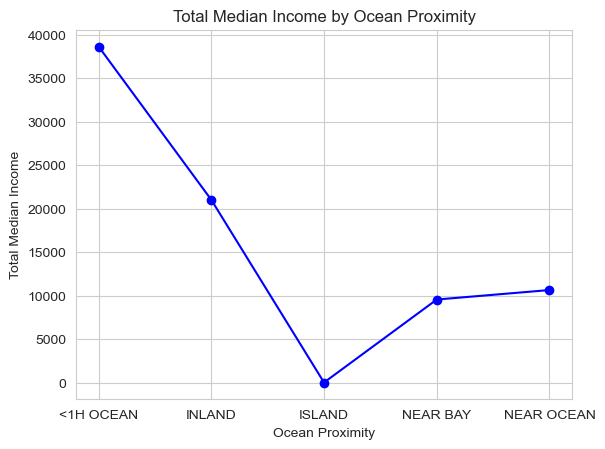

In [60]:
# Create a line chart for the same
# Data for the chart
categories = ['<1H OCEAN', 'INLAND', 'ISLAND', 'NEAR BAY', 'NEAR OCEAN']
total_median_income = [38651.51, 21022.1353, 13.7221, 9555.9061, 10647.376]

# Create the line chart
plt.plot(categories, total_median_income, marker='o', color='b')

# Add labels and title
plt.xlabel('Ocean Proximity')
plt.ylabel('Total Median Income')
plt.title('Total Median Income by Ocean Proximity')

# Display the chart
plt.show()

In [61]:
sub_df = df.copy()[["median_house_value", "ocean_proximity"]]
total_median_value = sub_df.groupby('ocean_proximity').sum()
total_median_value = total_median_value.rename({'median_house_value':'total_median_value'}, axis = 1)
total_median_value

,total_median_value
ocean_proximity,
<1H OCEAN,2.193410e+09
INLAND,8.176001e+08
ISLAND,1.902200e+06
NEAR BAY,5.935962e+08
NEAR OCEAN,6.629955e+08


The table presents the total median house values for different categories of houses based on their ocean proximity. Here's what we can understand from the table:

'<1H OCEAN': In the '<1H OCEAN' category, the total median house value is approximately $2.19 billion. This category represents houses located within a one-hour distance from the ocean.

'INLAND': The 'INLAND' category has a total median house value of around $817.6 million. These houses are situated further away from the immediate coastal areas.

'ISLAND': This category has the lowest total median house value, which amounts to about $1.9 million. These houses are located on islands.

'NEAR BAY': The 'NEAR BAY' category has a total median house value of approximately $593.6 million. These houses are situated near a bay area.

'NEAR OCEAN': The 'NEAR OCEAN' category has a total median house value of around $662.9 million. These houses are located close to the ocean but not directly on the coast.

In summary, the '<1H OCEAN' category has the highest total median house value, indicating that houses within a one-hour distance from the ocean tend to have a relatively higher value. On the other hand, the 'ISLAND' category has the lowest total median house value. This information provides insights into the relationship between ocean proximity and the overall value of houses in these areas.

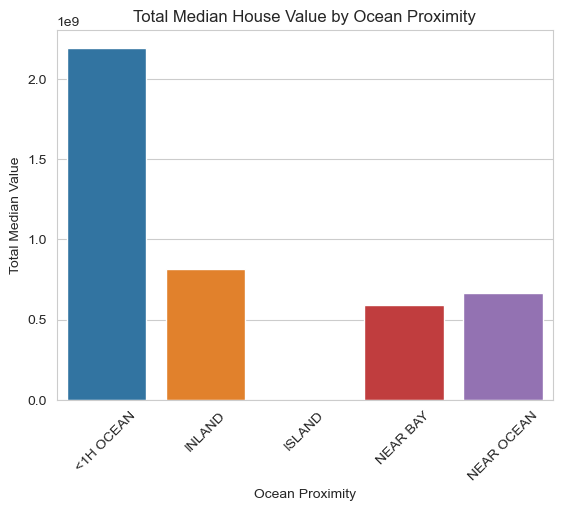

In [62]:
# Data for the plot
categories = ['<1H OCEAN', 'INLAND', 'ISLAND', 'NEAR BAY', 'NEAR OCEAN']
total_median_value = [2.193410e+09, 8.176001e+08, 1.902200e+06, 5.935962e+08, 6.629955e+08]

# Create a bar plot
sns.barplot(x=categories, y=total_median_value)

# Add labels and title
plt.xlabel('Ocean Proximity')
plt.ylabel('Total Median Value')
plt.title('Total Median House Value by Ocean Proximity')

# Rotate x-axis labels if needed
plt.xticks(rotation=45)

# Display the plot
plt.show()

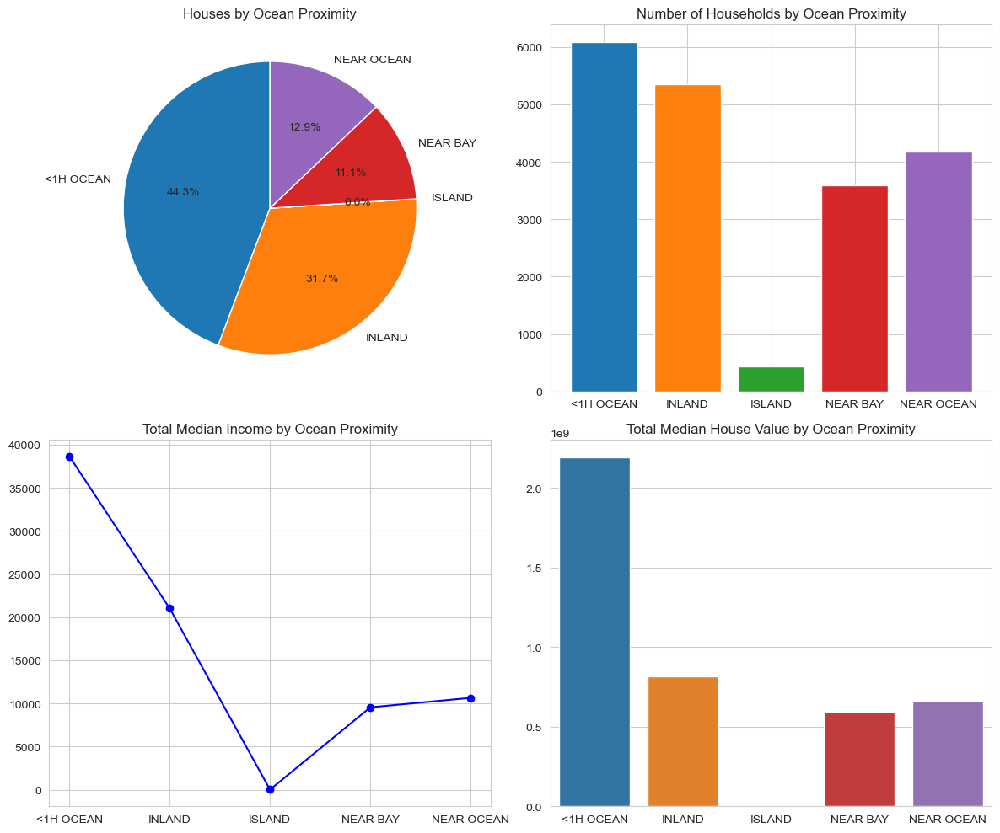

In [63]:
# Merge all of these plots in one-single display
# Create the subplots
fig, axs = plt.subplots(2, 2, figsize=(12, 10))

# Plot 1: Pie chart of houses by ocean proximity
labels = ['<1H OCEAN', 'INLAND', 'ISLAND', 'NEAR BAY', 'NEAR OCEAN']
sizes = [9136, 6551, 5, 2290, 2658]
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']
axs[0, 0].pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90)
axs[0, 0].set_title('Houses by Ocean Proximity')

# Plot 2: Bar chart of number of households by ocean proximity
categories = ['<1H OCEAN', 'INLAND', 'ISLAND', 'NEAR BAY', 'NEAR OCEAN']
households = [6082.0, 5358.0, 431.0, 3589.0, 4176.0]
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']
axs[0, 1].bar(categories, households, color=colors)
axs[0, 1].set_title('Number of Households by Ocean Proximity')

# Plot 3: Line chart of total median income by ocean proximity
categories = ['<1H OCEAN', 'INLAND', 'ISLAND', 'NEAR BAY', 'NEAR OCEAN']
total_median_income = [38651.51, 21022.1353, 13.7221, 9555.9061, 10647.376]
axs[1, 0].plot(categories, total_median_income, marker='o', color='b')
axs[1, 0].set_title('Total Median Income by Ocean Proximity')

# Plot 4: Bar chart of total median house value by ocean proximity
categories = ['<1H OCEAN', 'INLAND', 'ISLAND', 'NEAR BAY', 'NEAR OCEAN']
total_median_value = [2.193410e+09, 8.176001e+08, 1.902200e+06, 5.935962e+08, 6.629955e+08]
sns.barplot(x=categories, y=total_median_value, ax=axs[1, 1])
axs[1, 1].set_title('Total Median House Value by Ocean Proximity')

# Adjust the layout and spacing
plt.tight_layout()

# Save the combined plot as an image
plt.savefig('dashboard.png')

# Display the combined plot
plt.show()

In [64]:
sub_df = df.drop(['longitude', 'latitude'], axis = 1)
correlation_matrix = sub_df.corr()
correlation_matrix

C:\Users\User\AppData\Local\Temp\ipykernel_10096\665298026.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = sub_df.corr()


,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
housing_median_age,1.000000,-0.361262,-0.318998,-0.296244,-0.302916,-0.119034,0.105623
total_rooms,-0.361262,1.000000,0.927253,0.857126,0.918484,0.198050,0.134153
total_bedrooms,-0.318998,0.927253,1.000000,0.873910,0.974725,-0.007682,0.049454
population,-0.296244,0.857126,0.873910,1.000000,0.907222,0.004834,-0.024650
households,-0.302916,0.918484,0.974725,0.907222,1.000000,0.013033,0.065843
median_income,-0.119034,0.198050,-0.007682,0.004834,0.013033,1.000000,0.688075
median_house_value,0.105623,0.134153,0.049454,-0.024650,0.065843,0.688075,1.000000


In [65]:
# Create a correlation heatmap for all the attributes
import plotly.express as px
fig=px.imshow(df.corr(),text_auto=True, template='plotly_dark', color_continuous_scale=px.colors.sequential.Blues, aspect='auto',title='<b>Correlation matrix')
fig.update_layout(title_x=0.5)
fig.show()

C:\Users\User\AppData\Local\Temp\ipykernel_10096\3821584511.py:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  fig=px.imshow(df.corr(),text_auto=True, template='plotly_dark', color_continuous_scale=px.colors.sequential.Blues, aspect='auto',title='<b>Correlation matrix')


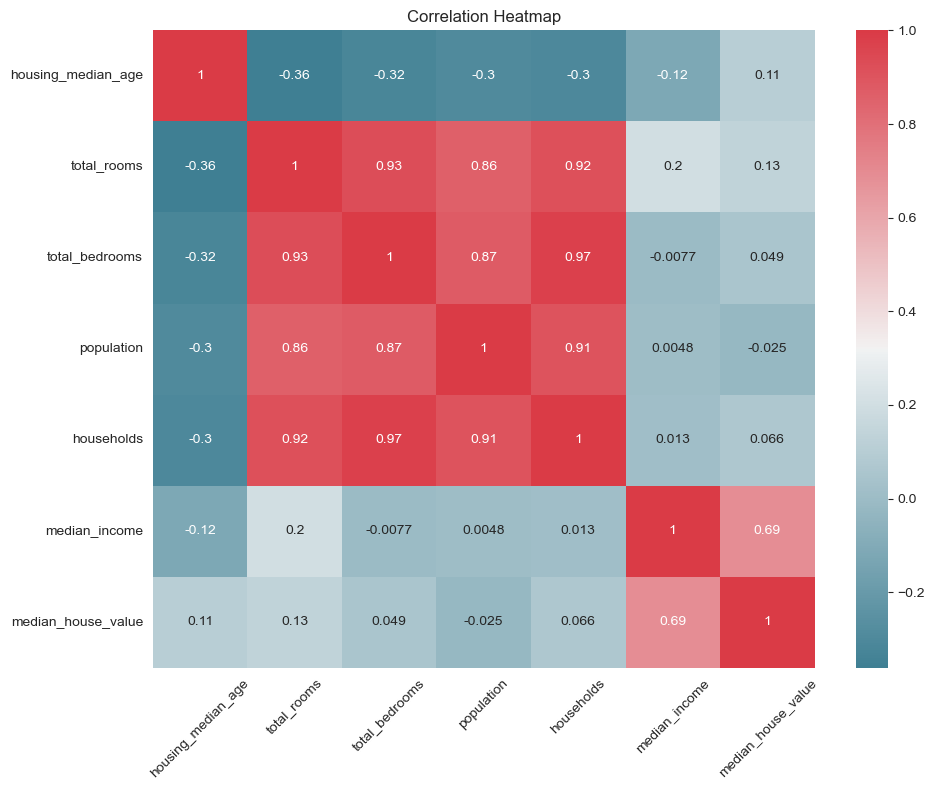

In [66]:
# Create a correlation heatmap for the same

# Create a figure and axes for the heatmap
fig, ax = plt.subplots(figsize=(10, 8))

# Define a colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Generate the heatmap
sns.heatmap(correlation_matrix, annot=True, cmap=cmap, ax=ax)

# Add a title
plt.title('Correlation Heatmap')

# Rotate x-axis tick labels if needed
plt.xticks(rotation=45)

# Adjust the layout
plt.tight_layout()

# Display the heatmap
plt.show()






The correlation matrix shows the relationships between different variables in the dataset.

Each value in the matrix represents the strength and direction of the relationship between two variables. The values range from -1 to 1.

For example, the correlation between housing_median_age and median_house_value is 0.11, indicating a weak positive relationship. This means that as the housing median age increases, the median house value tends to slightly increase as well.

On the other hand, the correlation between total_rooms and median_income is 0.20, suggesting a weak positive relationship. This means that as the number of total rooms increases, the median income also tends to slightly increase.

It's important to note that correlation does not imply causation. These correlations indicate how variables tend to change together, but they do not prove a cause-and-effect relationship.

Overall, the correlation matrix helps us understand the relationships between different variables in the dataset and provides insights into how they might be connected.

A pairplot is a graphical representation that shows the pairwise relationships between variables in a dataset. It allows us to visualize the scatterplots for each combination of variables, along with the distributions of individual variables on the diagonal.

In the context of the California housing dataset, a pairplot can be useful for analyzing the relationships between different features or variables. It helps us understand how each variable relates to others and whether there are any noticeable patterns or trends.

For example, by looking at the pairplot, we can quickly identify if there are any strong correlations between variables. If two variables show a clear linear relationship in the scatterplot, it suggests that they are positively or negatively correlated. Additionally, the distributions on the diagonal can give us insights into the individual variables and their spread.

Overall, the pairplot allows us to visually explore the relationships and distributions in the California housing dataset, helping us identify any interesting patterns or connections between the variables.

Correlation between median house value (target) & all the other attributes:

1. Correlation between the attributes "median_income" & "median_house_value" is 69%.

2. Correlation between the attributes "households" & "median_house_value" is 6.6%.

3. Correlation between the attributes "population" & "median_house_value" is -2.5%.

4. Correlation between the attributes "total_bedrooms" & "median_house_value is 4.9%.

5. Correlation between the attributes "total_rooms" & "median_house_value" is 13%.

6. Correlation between the attributes "housing_median_age" & "median_house_value" is 11%.

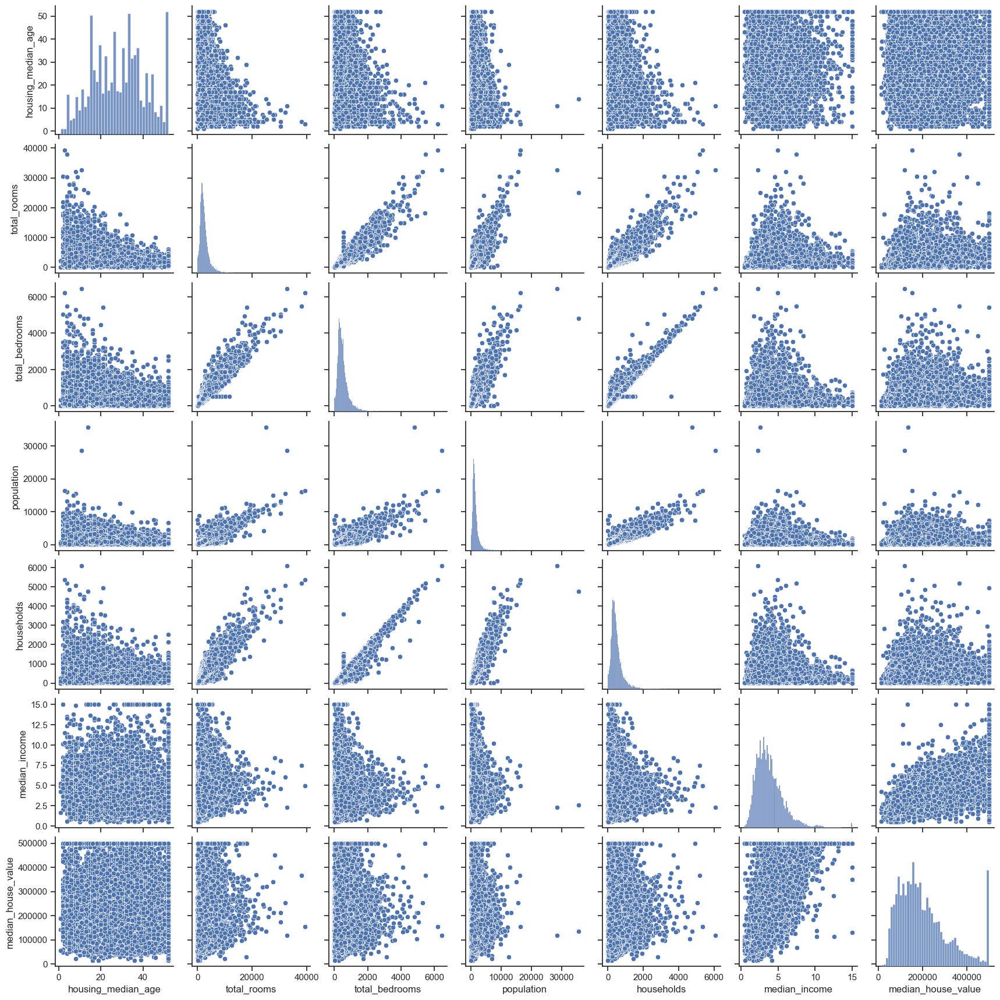

In [67]:
# Create a pairplot
sub_df = df.drop(['latitude', 'longitude'], axis = 1)
sns.set(style="ticks", color_codes=True)
sns.pairplot(sub_df)

# Display the plot
plt.show()

Scatter plots: The pair plot consists of multiple scatter plots, where each plot shows the relationship between two variables. Each point on the scatter plot represents a specific house in California.

Axes: The horizontal and vertical axes on each scatter plot represent the values of the two variables being compared. For example, the horizontal axis could represent the longitude values, and the vertical axis could represent the latitude values.

Data points: Each point on the scatter plot represents a house. The position of the point on the plot corresponds to the values of the two variables being compared. For example, a point higher on the vertical axis means a higher latitude value.

Patterns and trends: By looking at the scatter plots, we can identify any patterns or trends in the data. For instance, if we notice that as the median_income increases, the median_house_value also tends to increase, it suggests a positive relationship between income and house value.

Outliers: Outliers are data points that deviate significantly from the general pattern or trend. They are represented by points that are far away from the main cluster of points on the scatter plot. Identifying outliers can help us understand if there are any exceptional cases in the data.

By analyzing the pair plot, we can gain insights into the relationships between the different variables and how they may impact the median house value. It allows us to explo

A histogram is a type of graph that shows the distribution of a single variable. It helps us understand how the values of that variable are spread out and how frequently they occur.

Imagine you have a list of numbers that represent the prices of houses in California. Now, you want to see how many houses fall into different price ranges. A histogram can help with that.

You divide the price range into several bins or groups. Each bin represents a specific range of prices, like $100,000 to $200,000, $200,000 to $300,000, and so on.

Then, you count how many houses fall into each bin. For example, you might find that 50 houses have prices between $100,000 and $200,000, while 100 houses have prices between $200,000 and $300,000.

Next, you create a bar chart where the length of each bar represents the count of houses in each price range. The taller the bar, the more houses fall into that particular price range.

This histogram allows you to visualize the distribution of house prices. It helps you understand which price ranges have more or fewer houses. For example, if you see a tall bar in the range of $300,000 to $400,000, it means there are many houses in that price range.

By looking at the histogram, you can quickly identify the most common price ranges and get an overview of how the house prices are distributed across different ranges. It helps you see if the prices are concentrated in a specific range or spread out evenly.

Histograms are useful because they provide a visual summary of the data, making it easier to grasp the overall distribution and identify any patterns or trends.

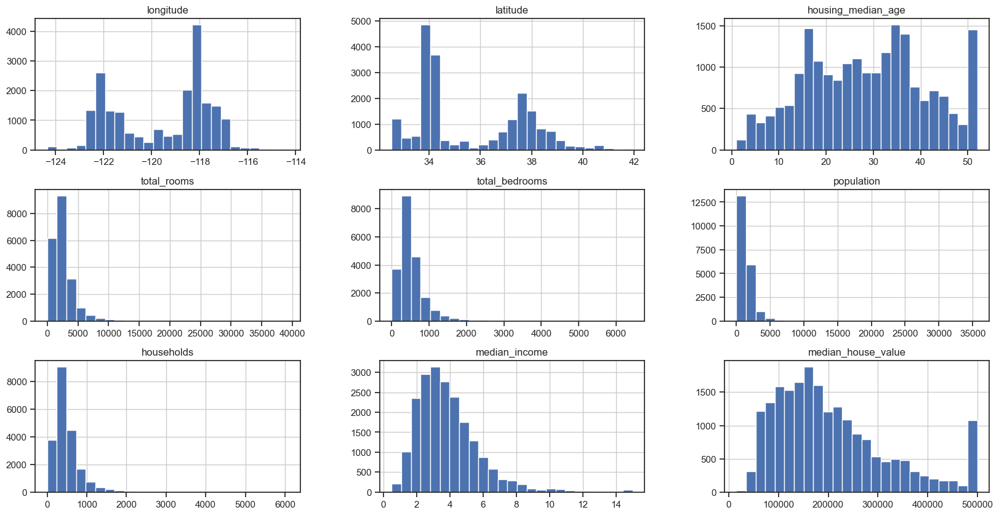

In [68]:
# Histogram
df.hist(bins=25,figsize=(20,10));

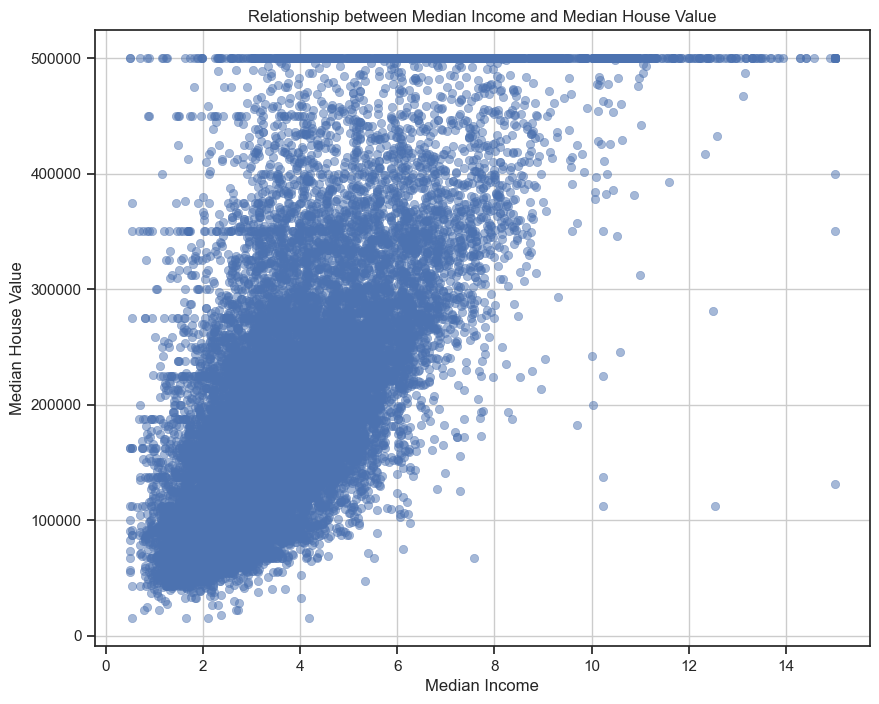

In [69]:
# Create a scatter plot to see the relationship between "median_income" & "median_house value"
plt.figure(figsize=(10, 8))
sns.scatterplot(data=df, x="median_income", y="median_house_value", alpha=0.5, edgecolor=None)
plt.xlabel('Median Income')
plt.ylabel('Median House Value')
plt.title('Relationship between Median Income and Median House Value')
plt.grid(True)
plt.show()

In this scatter plot, the x-axis represents the "Median Income" and the y-axis represents the "Median House Value" for houses in California.

Observing the scatter plot, we can make the following interpretations:

Positive Relationship: As we move from left to right along the x-axis (Median Income), there is a general upward trend in the y-axis (Median House Value). This indicates a positive relationship between income and house value. In simpler terms, houses with higher median incomes tend to have higher median house values.

Data Concentration: Most of the data points are concentrated in the lower to middle income ranges and house value ranges. This suggests that the majority of houses in California fall within these ranges.

Outliers: We can identify a few data points that stand out from the main cluster. These outliers represent houses with significantly higher median house values compared to their respective median incomes. They might correspond to high-end properties or unique cases that drive up the house value.

Income and House Value Ranges: By examining the scatter plot, we can roughly estimate the range of median incomes and median house values. For example, most data points are distributed between $20000  and  $100000 for median incomes, while median house values span from approximately $50000 to $500000.

This enhanced scatter plot provides a clear visual representation of the relationship between median income and median house value. It indicates that higher median incomes generally correspond to higher median house values. 

<Figure size 1000x800 with 0 Axes>

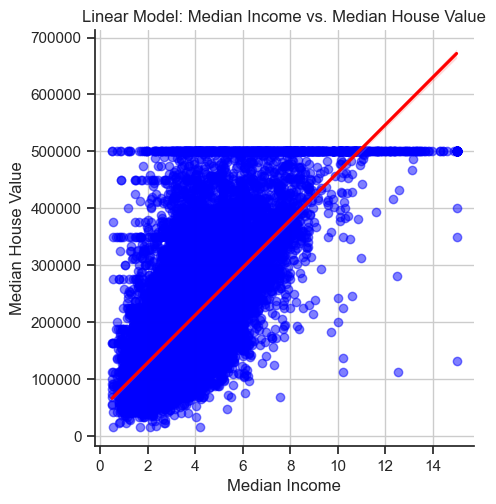

In [70]:
# Create a linear model plot demonstrating the above relationship
plt.figure(figsize=(10, 8))
sns.lmplot(data=df, x="median_income", y="median_house_value", scatter_kws={"alpha": 0.5, "color": "blue"}, line_kws={"color": "red"})
plt.xlabel('Median Income')
plt.ylabel('Median House Value')
plt.title('Linear Model: Median Income vs. Median House Value')
plt.grid(True)
plt.show()

In [71]:
fig = px.scatter(df, x="median_income", y="median_house_value", trendline="ols", color_discrete_sequence=['steelbl'],
                template='plotly_dark', title='<b>Target variable dependency on median_income', color='median_house_value', color_continuous_scale=px.colors.sequential.Blues)
fig.update_layout(title_x=0.5)
fig.show()

In this linear model plot, the x-axis represents the "Median Income" and the y-axis represents the "Median House Value" for houses in California.

Linear Trend: The red line in the plot represents the linear regression line, which represents the overall trend between median income and median house value. The line provides an estimation of the relationship between the two variables. It slopes upwards from left to right, indicating a positive correlation. In simpler terms, it suggests that as the median income increases, the median house value tends to increase as well.

Data Distribution: The blue scatter points represent the actual data points. Each point represents a house in California with its corresponding median income and median house value. The scatter points are spread around the regression line, indicating the variability in house values at different income levels.

Prediction Range: By observing the linear model plot, we can use the regression line to make predictions. For example, if we have a new data point representing a house's median income, we can use the line to estimate its corresponding median house value.

This linear model plot provides a visual representation of the relationship between median income and median house value, using a fitted regression line. It indicates a positive correlation between these attributes, suggesting that higher median incomes tend to be associated with higher median house values. The plot serves as a useful tool for understanding and predicting house values based on income levels.

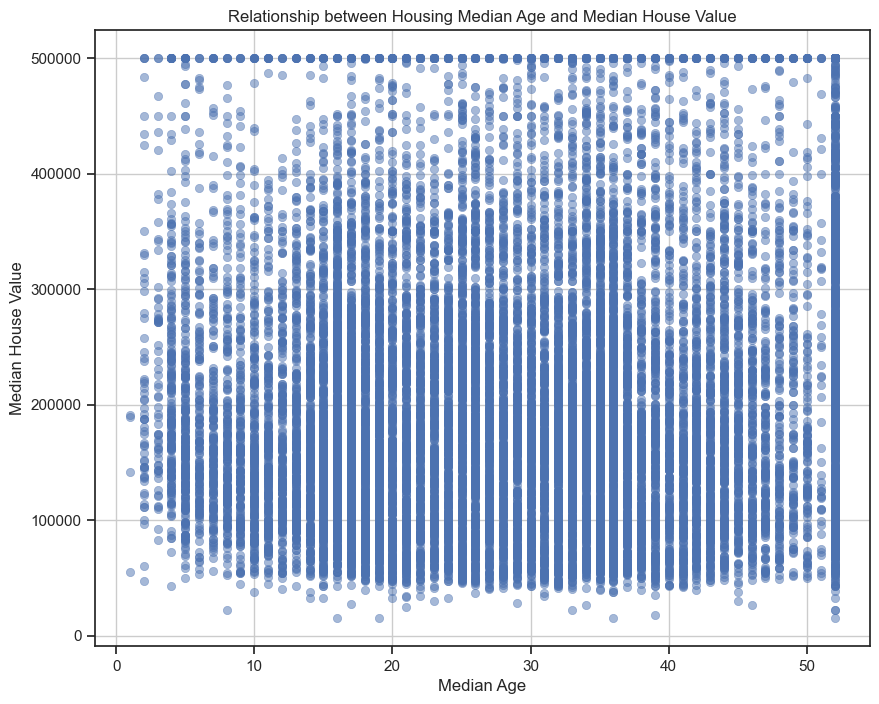

In [72]:
# Create a scatter plot depicting the relationship between the Housing Median Age & Median House Value
plt.figure(figsize=(10, 8))
sns.scatterplot(data=df, x="housing_median_age", y="median_house_value", alpha=0.5, edgecolor=None)
plt.xlabel('Median Age')
plt.ylabel('Median House Value')
plt.title('Relationship between Housing Median Age and Median House Value')
plt.grid(True)
plt.show()

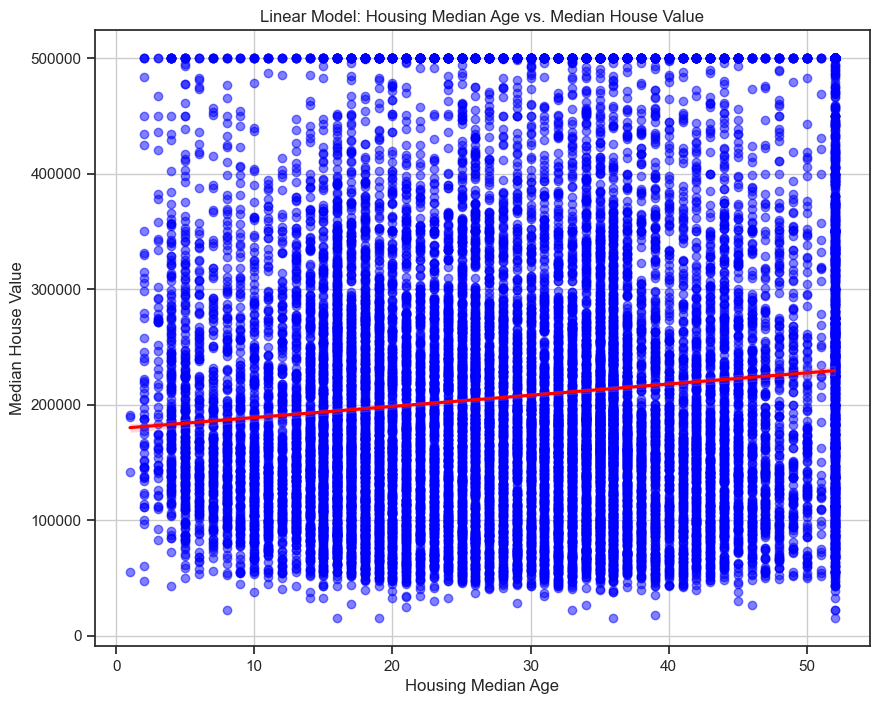

In [73]:
# Create a linear model plot that depicts the relationship between bot these attributes
plt.figure(figsize=(10, 8))
sns.regplot(data=df, x="housing_median_age", y="median_house_value", scatter_kws={"alpha": 0.5, "color": "blue"}, line_kws={"color": "red"})
plt.xlabel('Housing Median Age')
plt.ylabel('Median House Value')
plt.title('Linear Model: Housing Median Age vs. Median House Value')
plt.grid(True)
plt.show()

In [74]:
fig = px.scatter(df, x="housing_median_age", y="median_house_value", trendline="ols", color_discrete_sequence=['steelbl'],
                template='plotly_dark', title='<b>Target variable dependency on housing_median_age', color='median_house_value', color_continuous_scale=px.colors.sequential.Blues)
fig.update_layout(title_x=0.5)
fig.show()

In this linear model plot, the x-axis represents the "Housing Median Age" and the y-axis represents the "Median House Value" for houses in California.

Here's a simple interpretation of the plot:

Linear Trend: The red line in the plot represents the linear regression line, which estimates the relationship between housing median age and median house value. The line slopes slightly upwards or remains relatively flat, indicating a weak or no significant correlation between the two variables. In simpler terms, there is no strong relationship between the housing median age and median house value.

Data Distribution: The blue scatter points represent the actual data points. Each point represents a house in California with its corresponding housing median age and median house value. The scatter points are spread around the regression line, suggesting that there is considerable variability in median house values across different housing median age values.

Prediction Range: Although the linear regression line provides an estimation of the relationship between housing median age and median house value, it is important to note that the relationship appears weak. Therefore, it might not be reliable for predicting median house values based solely on housing median age.

This linear model plot shows the relationship between housing median age and median house value using a fitted regression line. However, it indicates a weak or no significant correlation between these attributes. I

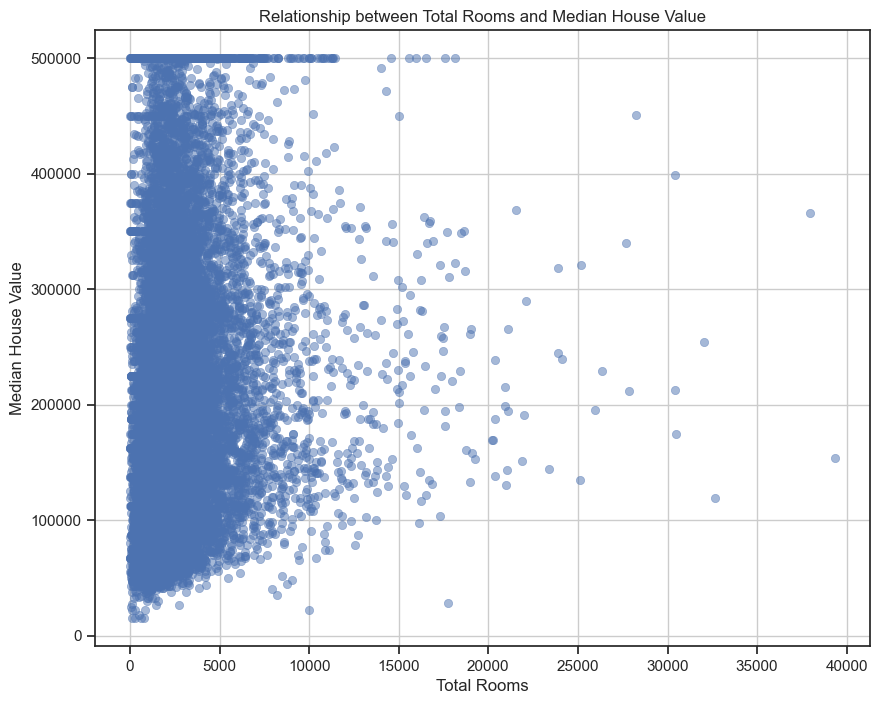

In [75]:
# Create a scatter plot that depicts the relationship between "total_rooms" & "median_house_value"
plt.figure(figsize=(10, 8))
sns.scatterplot(data=df, x="total_rooms", y="median_house_value", alpha=0.5, edgecolor=None)
plt.xlabel('Total Rooms')
plt.ylabel('Median House Value')
plt.title('Relationship between Total Rooms and Median House Value')
plt.grid(True)
plt.show()

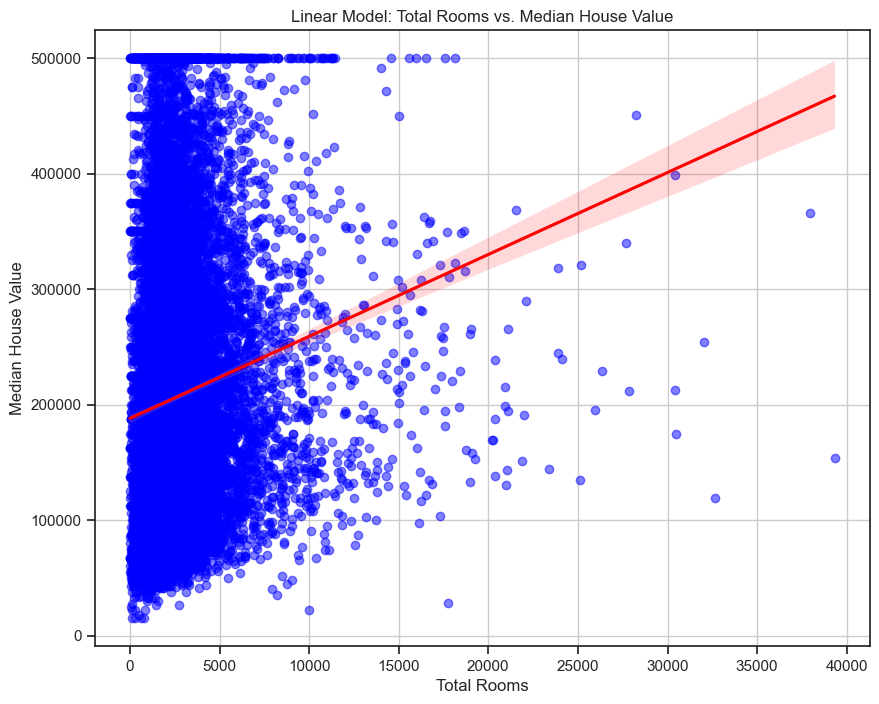

In [76]:
# Create a linear model plot that depicts the relationship between "Total Rooms" & the "Median House Value"
plt.figure(figsize=(10, 8))
sns.regplot(data=df, x="total_rooms", y="median_house_value", scatter_kws={"alpha": 0.5, "color": "blue"}, line_kws={"color": "red"})
plt.xlabel('Total Rooms')
plt.ylabel('Median House Value')
plt.title('Linear Model: Total Rooms vs. Median House Value')
plt.grid(True)
plt.show()

In this linear model plot, the x-axis represents the "Total Rooms" and the y-axis represents the "Median House Value" for houses in California.

Here's a simple interpretation of the plot:

Linear Trend: The red line in the plot represents the linear regression line, which estimates the relationship between total rooms and median house value. The line slopes slightly upwards, indicating a weak positive correlation between the two variables. In simpler terms, houses with more total rooms tend to have slightly higher median house values.

Data Distribution: The blue scatter points represent the actual data points. Each point represents a house in California with its corresponding total rooms and median house value. The scatter points are spread around the regression line, suggesting that there is variability in median house values across different total room counts.

Prediction Range: While the linear regression line provides an estimation of the relationship between total rooms and median house value, it is important to note that the correlation appears weak. 

This linear model plot shows the relationship between total rooms and median house value using a fitted regression line. It suggests a weak positive correlation, indicating that houses with more total rooms tend to have slightly higher median house values. 

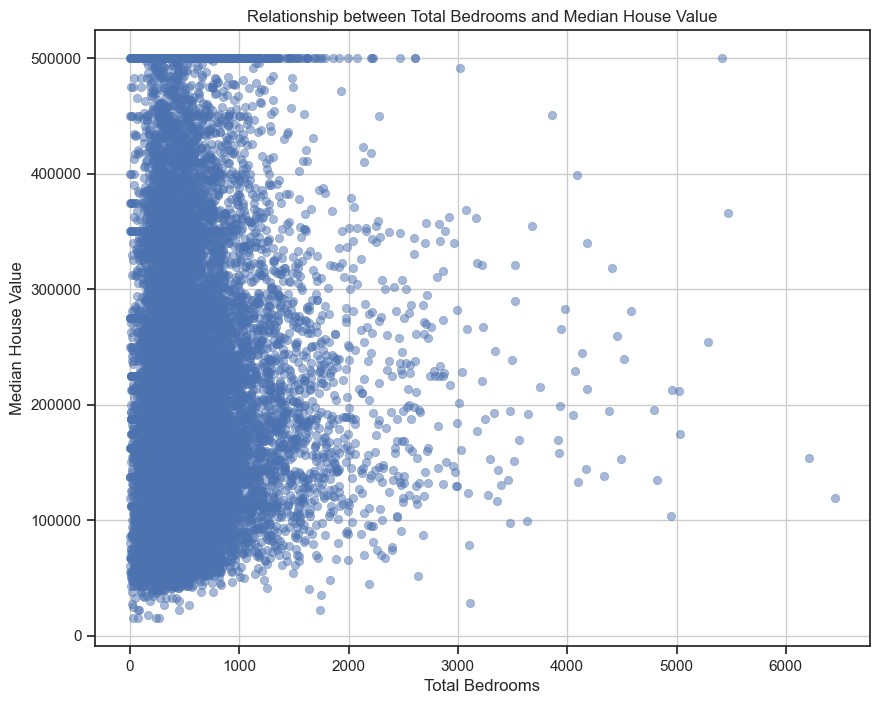

In [77]:
# Create a scatterplot that depicts the relationship between the total bedrooms & the median house value
plt.figure(figsize=(10, 8))
sns.scatterplot(data=df, x="total_bedrooms", y="median_house_value", alpha=0.5, edgecolor=None)
plt.xlabel('Total Bedrooms')
plt.ylabel('Median House Value')
plt.title('Relationship between Total Bedrooms and Median House Value')
plt.grid(True)
plt.show()

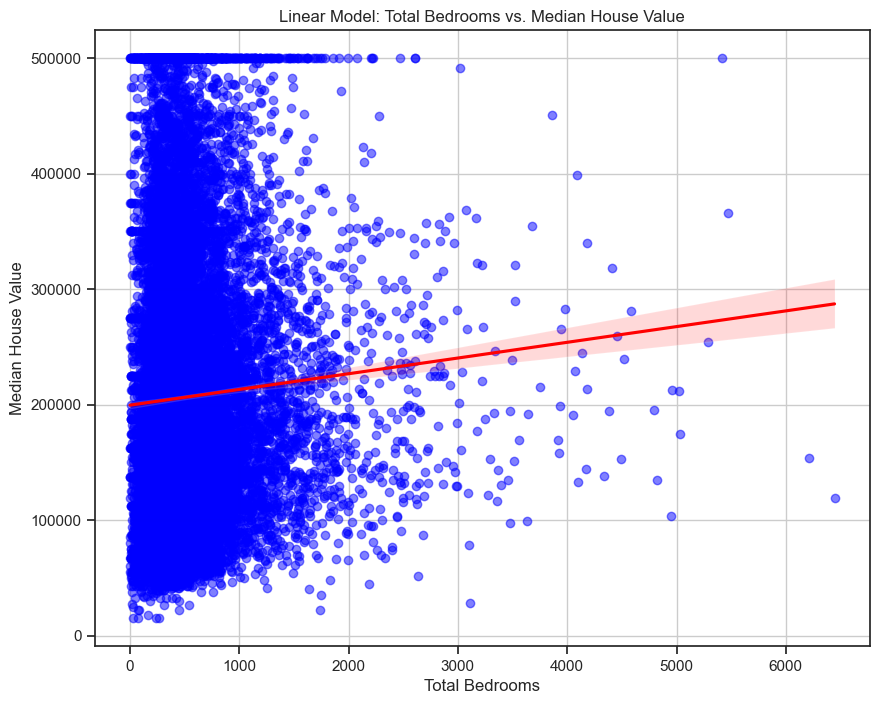

In [78]:
# Create a linear model that depicts the relationship between the "total_bedrooms" & "median_house_value"
plt.figure(figsize=(10, 8))
sns.regplot(data=df, x="total_bedrooms", y="median_house_value", scatter_kws={"alpha": 0.5, "color": "blue"}, line_kws={"color": "red"})
plt.xlabel('Total Bedrooms')
plt.ylabel('Median House Value')
plt.title('Linear Model: Total Bedrooms vs. Median House Value')
plt.grid(True)
plt.show()

In this linear model plot, the x-axis represents the "Total Bedrooms" and the y-axis represents the "Median House Value" for houses in California.

Here's a simple interpretation of the plot:

Linear Trend: The red line in the plot represents the linear regression line, which estimates the relationship between total bedrooms and median house value. The line slopes slightly upwards, indicating a weak positive correlation between the two variables. In simpler terms, houses with more total bedrooms tend to have slightly higher median house values.

Data Distribution: The blue scatter points represent the actual data points. Each point represents a house in California with its corresponding total bedrooms and median house value. The scatter points are spread around the regression line, suggesting that there is variability in median house values across different total bedroom counts.

Prediction Range: While the linear regression line provides an estimation of the relationship between total bedrooms and median house value, it is important to note that the correlation appears weak.

This linear model plot shows the relationship between total bedrooms and median house value using a fitted regression line. It suggests a weak positive correlation, indicating that houses with more total bedrooms tend to have slightly higher median house values. 

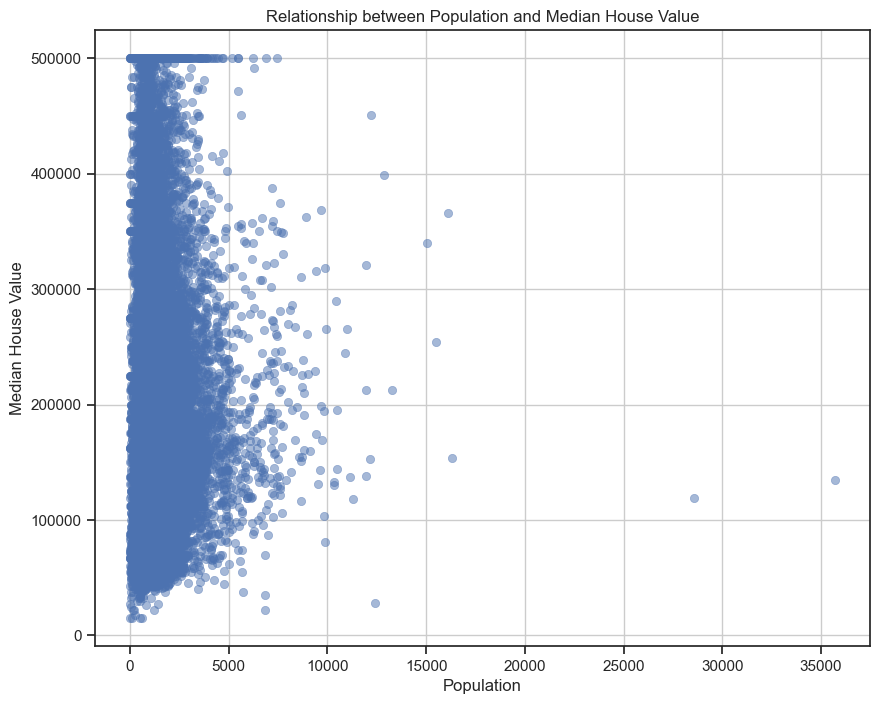

In [79]:
# Create a scatter plot that depicts the relationship between the attributes "Population" & "Median House Value"
plt.figure(figsize=(10, 8))
sns.scatterplot(data=df, x="population", y="median_house_value", alpha=0.5, edgecolor=None)
plt.xlabel('Population')
plt.ylabel('Median House Value')
plt.title('Relationship between Population and Median House Value')
plt.grid(True)
plt.show()

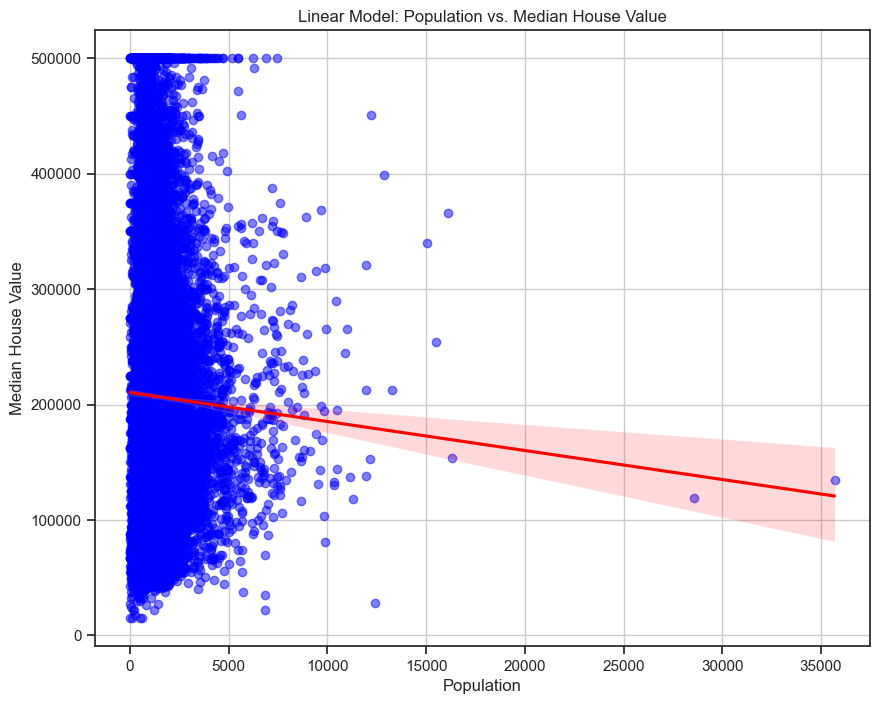

In [80]:
plt.figure(figsize=(10, 8))
sns.regplot(data=df, x="population", y="median_house_value", scatter_kws={"alpha": 0.5, "color": "blue"}, line_kws={"color": "red"})
plt.xlabel('Population')
plt.ylabel('Median House Value')
plt.title('Linear Model: Population vs. Median House Value')
plt.grid(True)
plt.show()

This linear model plot shows the relationship between population and median house value using a fitted regression line. It suggests that there is a negative correlation existing between these attributes. What can be understood from this plot is that with the increase in population of each housing unit, the median housing value is predicted to fall over a period of time.

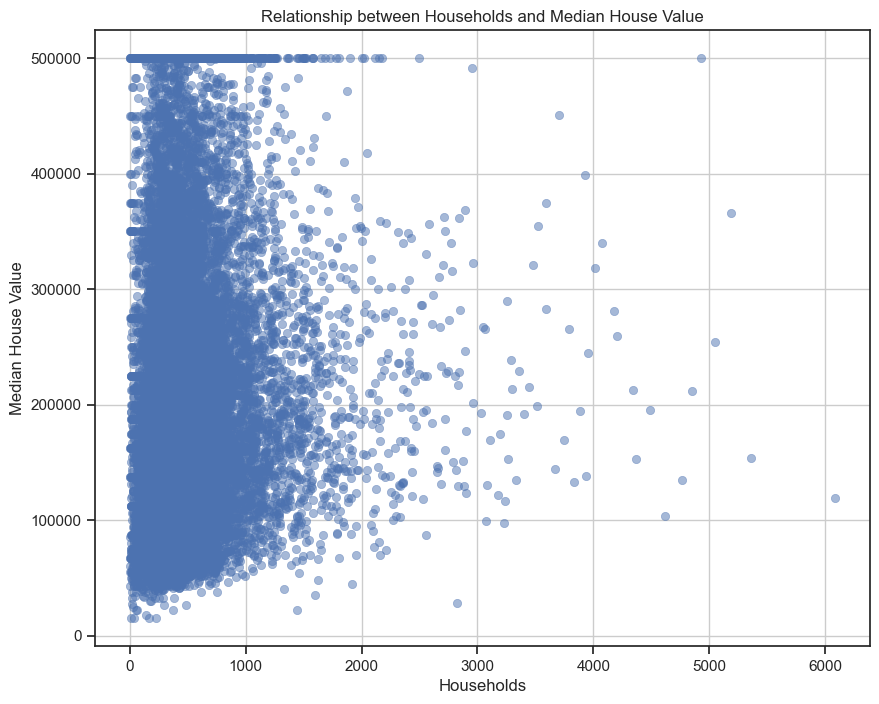

In [81]:
# Create a scatterplot that displays the relationship between the attributes "households" & "median housing value"
plt.figure(figsize=(10, 8))
sns.scatterplot(data=df, x="households", y="median_house_value", alpha=0.5, edgecolor=None)
plt.xlabel('Households')
plt.ylabel('Median House Value')
plt.title('Relationship between Households and Median House Value')
plt.grid(True)
plt.show()

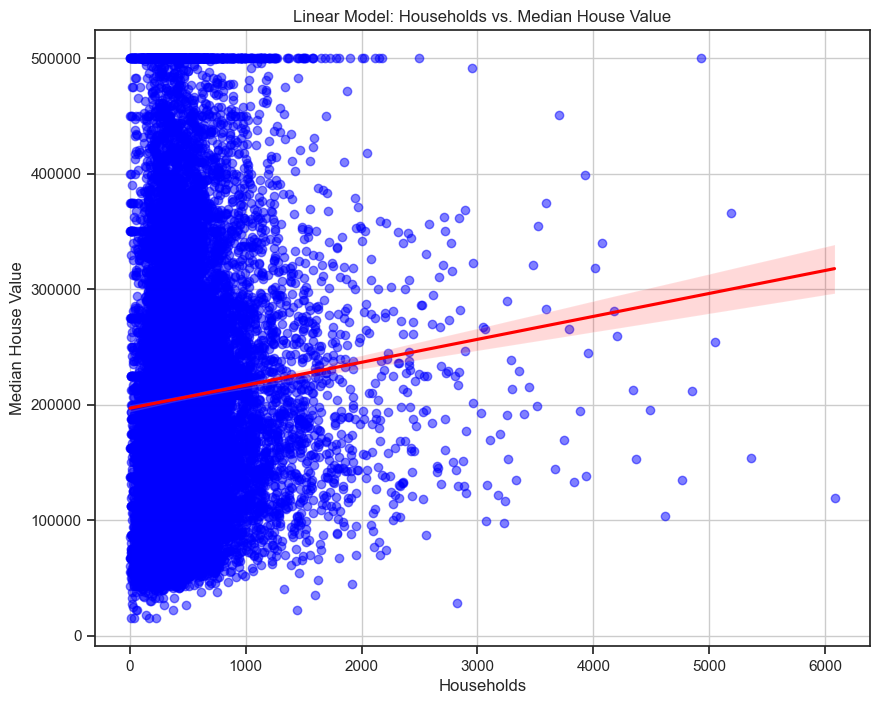

In [82]:
# Create a linear model depicting the relationship between "Households" & "Median House Value"
plt.figure(figsize=(10, 8))
sns.regplot(data=df, x="households", y="median_house_value", scatter_kws={"alpha": 0.5, "color": "blue"}, line_kws={"color": "red"})
plt.xlabel('Households')
plt.ylabel('Median House Value')
plt.title('Linear Model: Households vs. Median House Value')
plt.grid(True)
plt.show()

Linear Trend: The red line in the plot represents the linear regression line, which estimates the relationship between households and median house value. The line slopes slightly upwards, indicating a weak positive correlation between the two variables. In simpler terms, areas with more households tend to have slightly higher median house values.

Data Distribution: The blue scatter points represent the actual data points. Each point represents a house in California with its corresponding households and median house value. The scatter points are spread around the regression line, suggesting that there is variability in median house values across different household counts.

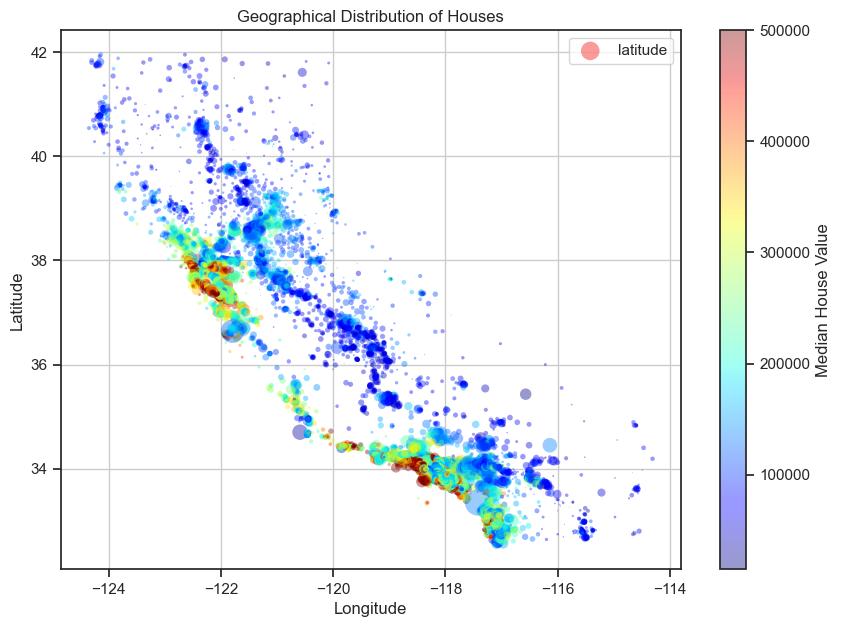

In [83]:
# Create a map that displays the geographical distribution of houses
plt.figure(figsize=(10, 7))
plt.scatter(data=df, x="longitude", y="latitude", alpha=0.4, s=df["population"]/100,
            c="median_house_value", cmap=plt.get_cmap("jet"), edgecolor='none')
plt.colorbar(label='Median House Value')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Geographical Distribution of Houses')
plt.legend()
plt.grid(True)
plt.show()

In this plot, each marker represents a house in California, and its location is determined by its latitude and longitude coordinates.

Here's a simple interpretation of the plot:

Geographical Distribution: The scatter plot displays the geographical distribution of houses across California. Each marker represents a house's location, with the x-axis representing longitude and the y-axis representing latitude.

Population: The size of each marker is proportional to the population of the corresponding area. Larger markers indicate higher population density.

Median House Value: The color of each marker represents the median house value for that particular area. The color bar on the right side of the plot indicates the corresponding median house values.

Patterns: By observing the plot, we can identify certain patterns. For example, areas with higher median house values tend to be clustered in specific regions, indicated by clusters of markers with similar colors. This suggests that location plays a significant role in determining house prices.

Insights: This plot provides a visual representation of the geographical distribution of houses in California, with markers indicating population size and color representing the median house value. It can help identify areas with higher or lower median house values and potentially provide insights into the relationship between location and housing prices.

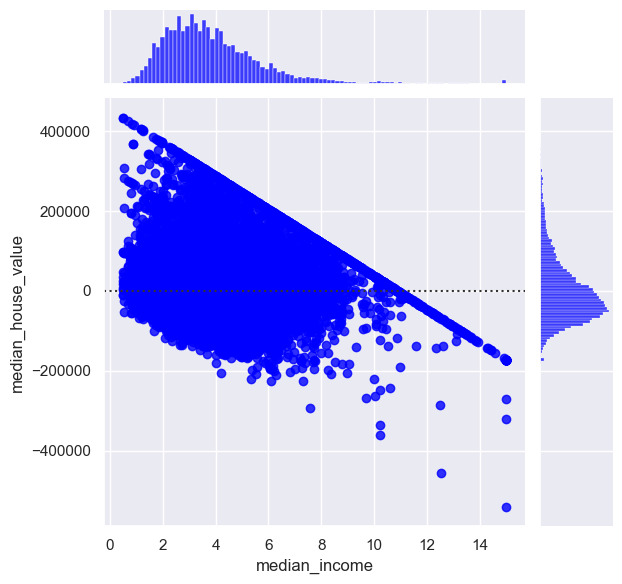

In [84]:
# Create a jointplot that represents the relationship between "median_income"
import seaborn as sns

sns.set_style("darkgrid")
sns.jointplot(x="median_income", y="median_house_value", data=df, kind="resid", color='blue')


In this joint plot, we are examining the relationship between median income and median house value. The plot consists of two main components:

Scatter Plot: The scatter plot shows the individual data points, with median income on the x-axis and median house value on the y-axis. Each point represents a specific observation in the dataset, displaying the relationship between these two variables. The points' distribution and clustering can provide insights into the strength and direction of the relationship.

Residual Plot: The residual plot appears on the right side of the joint plot. It represents the vertical distance between each data point and the regression line. This plot allows us to assess the difference between the actual median house values and the predicted values based on the regression model. The residuals provide information about the variability or errors in the model's predictions.

Interpretation:

By analyzing this joint plot, we can observe the following:

Scatter Plot: The scatter plot shows the overall trend between median income and median house value. If the points tend to form an upward-sloping pattern, it indicates a positive correlation, meaning that as median income increases, median house value tends to increase as well. Conversely, a downward-sloping pattern indicates a negative correlation.

Residual Plot: The residual plot helps us assess the accuracy of the regression model. If the residuals are randomly scattered around zero and exhibit no discernible pattern, it suggests that the linear regression model is capturing the relationship between median income and median house value fairly well. However, if there is a noticeable pattern or systematic deviation in the residuals, it may indicate that the linear model is not sufficient to explain the relationship accurately.

By analyzing both the scatter plot and the residual plot, we can gain insights into the relationship between median income and median house value and evaluate the performance of the linear regression model.

## Linear Regression

Linear regression is a statistical method used to model the relationship between a dependent variable and one or more independent variables. It assumes that there is a linear relationship between the variables, meaning that as the independent variable changes, the dependent variable also changes in a consistent and predictable way.

In the context of predicting the median housing value, linear regression can be used to find a mathematical equation that represents the relationship between various factors or features (independent variables) and the median housing value (dependent variable). By fitting a line or a hyperplane to the data, linear regression helps us understand how changes in the independent variables affect the median housing value.

In [85]:
# Use linear regression method to exactly know the relation between the attributes 'median_income' & 'median house value'
# create a fitted model
import statsmodels.formula.api as smf

lm1 = smf.ols(formula='median_house_value ~ median_income', data = df).fit()

In [86]:
# Obtain the summary of the entire model
lm1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:     median_house_value   R-squared:                       0.473
Model:                            OLS   Adj. R-squared:                  0.473
Method:                 Least Squares   F-statistic:                 1.856e+04
Date:                Wed, 24 May 2023   Prob (F-statistic):               0.00
Time:                        12:38:44   Log-Likelihood:            -2.6325e+05
No. Observations:               20640   AIC:                         5.265e+05
Df Residuals:                   20638   BIC:                         5.265e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept      4.509e+04   1322.872     34.082      0.000    4.25e+04    4.77e+04
median_income  4.179e+04    306.806    136.223      0.000    4.12e+04    4.24e+04
==============================================================================
Omnibus:                     4245.795   Durbin-Watson:                   0.655
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             9273.446
Skew:                           1.191   Prob(JB):                         0.00
Kurtosis:                       5.260   Cond. No.                         10.2
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

R-squared: The R-squared value (0.473) represents the proportion of the variance in the median house value that can be explained by the linear regression model. In simpler terms, it indicates that approximately 47.3% of the variability in the median house value can be attributed to the median income variable.

F-statistic: The F-statistic (1.856e+04) tests the overall significance of the regression model. The associated probability (Prob (F-statistic)) indicates that the regression model as a whole is highly significant (p < 0.05), suggesting that the median income variable is a significant predictor of the median house value.

Coefficients: The coefficients represent the estimated effect of each independent variable on the dependent variable. In this case, we have two coefficients:

Intercept: The intercept coefficient (4.509e+04) represents the estimated median house value when the median income is zero. However, since it is unlikely for the median income to be zero, the intercept coefficient is not as interpretable in this context.

Median Income: The coefficient for median income (4.179e+04) suggests that, on average, for every unit increase in median income, the median house value increases by approximately $41,790.

Standard Errors and t-values: The standard errors measure the average amount that the coefficient estimates vary from the actual population values. The t-values assess the statistical significance of each coefficient. In this case, both coefficients have very small p-values (p < 0.05), indicating that they are statistically significant predictors of the median house value.

Confidence Intervals: The confidence intervals provide a range within which we can be reasonably confident that the true population values of the coefficients lie. The intervals (0.025 and 0.975) indicate that we are 95% confident that the true values of the intercept and median income coefficients fall within those respective ranges.

In summary, this linear regression model suggests that median income is a significant predictor of the median house value. As the median income increases, the median house value tends to increase as well. 

In [87]:
# Create a linear model that depicts the relation between "housing_median_age" & "median_house_value"
lm2 = smf.ols(formula='median_house_value ~ housing_median_age', data = df).fit()

In [88]:
lm2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:     median_house_value   R-squared:                       0.011
Model:                            OLS   Adj. R-squared:                  0.011
Method:                 Least Squares   F-statistic:                     232.8
Date:                Wed, 24 May 2023   Prob (F-statistic):           2.76e-52
Time:                        12:38:46   Log-Likelihood:            -2.6975e+05
No. Observations:               20640   AIC:                         5.395e+05
Df Residuals:                   20638   BIC:                         5.395e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept           1.791e+05   1985.416     90.218      0.000    1.75e+05    1.83e+05
housing_median_age   968.4496     63.467     15.259      0.000     844.050    1092.850
==============================================================================
Omnibus:                     2269.585   Durbin-Watson:                   0.325
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             3093.615
Skew:                           0.938   Prob(JB):                         0.00
Kurtosis:                       3.281   Cond. No.                         77.8
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

R-squared: The R-squared value (0.011) represents the proportion of the variance in the median house value that can be explained by the linear regression model. In simpler terms, it indicates that only about 1.1% of the variability in the median house value can be attributed to the housing median age variable. This means that the housing median age alone is not a strong predictor of the median house value.

F-statistic: The F-statistic (232.8) tests the overall significance of the regression model. The associated probability (Prob (F-statistic)) indicates that the regression model as a whole is highly significant (p < 0.05), suggesting that there is a relationship between the housing median age and the median house value.

Coefficients: The coefficients represent the estimated effect of each independent variable on the dependent variable. In this case, we have two coefficients:

Intercept: The intercept coefficient (1.791e+05) represents the estimated median house value when the housing median age is zero. However, since the housing median age cannot be zero in this context, the intercept coefficient is not as interpretable.

Housing Median Age: The coefficient for housing median age (968.4496) suggests that, on average, for every unit increase in the housing median age, the median house value increases by approximately $968.

Standard Errors and t-values: The standard errors measure the average amount that the coefficient estimates vary from the actual population values. The t-values assess the statistical significance of each coefficient. In this case, both coefficients have very small p-values (p < 0.05), indicating that they are statistically significant predictors of the median house value.

Confidence Intervals: The confidence intervals provide a range within which we can be reasonably confident that the true population values of the coefficients lie. The intervals (0.025 and 0.975) indicate that we are 95% confident that the true values of the intercept and housing median age coefficients fall within those respective ranges.

In summary, this linear regression model suggests that the housing median age has a statistically significant but weak relationship with the median house value.

In [89]:
# Create a linear model that depicts the relationship between total rooms and median house value
lm3 = smf.ols(formula='median_house_value ~ total_rooms', data = df).fit()

In [90]:
# Obtain the summary of this linear model
lm3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:     median_house_value   R-squared:                       0.018
Model:                            OLS   Adj. R-squared:                  0.018
Method:                 Least Squares   F-statistic:                     378.2
Date:                Wed, 24 May 2023   Prob (F-statistic):           1.69e-83
Time:                        12:38:48   Log-Likelihood:            -2.6968e+05
No. Observations:               20640   AIC:                         5.394e+05
Df Residuals:                   20638   BIC:                         5.394e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept    1.882e+05   1248.379    150.717      0.000    1.86e+05    1.91e+05
total_rooms     7.0960      0.365     19.448      0.000       6.381       7.811
==============================================================================
Omnibus:                     2504.907   Durbin-Watson:                   0.333
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             3511.341
Skew:                           0.991   Prob(JB):                         0.00
Kurtosis:                       3.393   Cond. No.                     5.37e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.37e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

R-squared: The R-squared value (0.018) represents the proportion of the variance in the median house value that can be explained by the linear regression model. In simpler terms, it indicates that only about 1.8% of the variability in the median house value can be attributed to the total number of rooms. This means that the total number of rooms alone is not a strong predictor of the median house value.

F-statistic: The F-statistic (378.2) tests the overall significance of the regression model. The associated probability (Prob (F-statistic)) indicates that the regression model as a whole is highly significant (p < 0.05), suggesting that there is a relationship between the total number of rooms and the median house value.

Coefficients: The coefficients represent the estimated effect of each independent variable on the dependent variable. In this case, we have two coefficients:

Intercept: The intercept coefficient (1.882e+05) represents the estimated median house value when the total number of rooms is zero. However, since it is not possible for the total number of rooms to be zero in this context, the intercept coefficient is not as interpretable.

Total Rooms: The coefficient for total rooms (7.0960) suggests that, on average, for every additional room in a house, the median house value increases by approximately $7. This implies that houses with more rooms tend to have higher median values.

Standard Errors and t-values: The standard errors measure the average amount that the coefficient estimates vary from the actual population values. The t-values assess the statistical significance of each coefficient. In this case, both coefficients have very small p-values (p < 0.05), indicating that they are statistically significant predictors of the median house value.

Confidence Intervals: The confidence intervals provide a range within which we can be reasonably confident that the true population values of the coefficients lie. The intervals (0.025 and 0.975) indicate that we are 95% confident that the true values of the intercept and total rooms coefficients fall within those respective ranges.

In summary, this linear regression model suggests that the total number of rooms has a statistically significant but weak relationship with the median house value. The model explains only a small portion (1.8%) of the variability in the median house value.

In [91]:
# Create a multiple linear model to see what effect the attributes "total_rooms" & "total_bedrooms" would have on the target
lm4 = smf.ols(formula='median_house_value ~ total_rooms + total_bedrooms', data = df).fit()

In [92]:
lm4.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:     median_house_value   R-squared:                       0.058
Model:                            OLS   Adj. R-squared:                  0.058
Method:                 Least Squares   F-statistic:                     635.9
Date:                Wed, 24 May 2023   Prob (F-statistic):          9.74e-269
Time:                        12:38:50   Log-Likelihood:            -2.6925e+05
No. Observations:               20640   AIC:                         5.385e+05
Df Residuals:                   20637   BIC:                         5.385e+05
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept       1.982e+05   1268.690    156.210      0.000    1.96e+05    2.01e+05
total_rooms       33.3121      0.954     34.904      0.000      31.441      35.183
total_bedrooms  -147.1157      4.966    -29.624      0.000    -156.849    -137.382
==============================================================================
Omnibus:                     2401.286   Durbin-Watson:                   0.316
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             3319.372
Skew:                           0.959   Prob(JB):                         0.00
Kurtosis:                       3.426   Cond. No.                     5.67e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.67e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

R-squared: The R-squared value (0.058) represents the proportion of the variance in the median house value that can be explained by the linear regression model. In simpler terms, it indicates that about 5.8% of the variability in the median house value can be attributed to the total number of rooms and total number of bedrooms. This means that these two variables together have a weak influence on the median house value.

F-statistic: The F-statistic (635.9) tests the overall significance of the regression model. The associated probability (Prob (F-statistic)) is virtually zero (p < 0.05), indicating that the regression model as a whole is highly significant and suggests that there is a relationship between the total number of rooms, total number of bedrooms, and the median house value.

Coefficients: The coefficients represent the estimated effect of each independent variable on the dependent variable. In this case, we have three coefficients:

Intercept: The intercept coefficient (1.982e+05) represents the estimated median house value when both the total number of rooms and total number of bedrooms are zero. However, since it is not realistic for these variables to be zero in this context, the intercept coefficient is not as interpretable.

Total Rooms: The coefficient for total rooms (33.3121) suggests that, on average, for every additional room in a house, the median house value increases by approximately $33. This implies that houses with more rooms tend to have higher median values.

Total Bedrooms: The coefficient for total bedrooms (-147.1157) suggests that, on average, for every additional bedroom in a house, the median house value decreases by approximately $147. This implies that houses with more bedrooms tend to have lower median values.

Standard Errors and t-values: The standard errors measure the average amount that the coefficient estimates vary from the actual population values. The t-values assess the statistical significance of each coefficient. In this case, all coefficients have very small p-values (p < 0.05), indicating that they are statistically significant predictors of the median house value.

Confidence Intervals: The confidence intervals provide a range within which we can be reasonably confident that the true population values of the coefficients lie. The intervals (0.025 and 0.975) indicate that we are 95% confident that the true values of the intercept, total rooms, and total bedrooms coefficients fall within those respective ranges.

In summary, this linear regression model suggests that the total number of rooms and total number of bedrooms together have a statistically significant but weak relationship with the median house value. 

In [93]:
# Create a linear model to show the effect of "population" & "households" on "median_house_value"
lm5 = smf.ols(formula='median_house_value ~ population + households', data = df).fit()

In [94]:
lm5.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:     median_house_value   R-squared:                       0.045
Model:                            OLS   Adj. R-squared:                  0.044
Method:                 Least Squares   F-statistic:                     481.4
Date:                Wed, 24 May 2023   Prob (F-statistic):          4.49e-205
Time:                        12:38:54   Log-Likelihood:            -2.6940e+05
No. Observations:               20640   AIC:                         5.388e+05
Df Residuals:                   20637   BIC:                         5.388e+05
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    2.01e+05   1299.098    154.698      0.000    1.98e+05    2.04e+05
population   -48.5935      1.648    -29.482      0.000     -51.824     -45.363
households   150.4531      4.882     30.818      0.000     140.884     160.022
==============================================================================
Omnibus:                     2498.398   Durbin-Watson:                   0.392
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             3504.830
Skew:                           0.963   Prob(JB):                         0.00
Kurtosis:                       3.604   Cond. No.                     3.18e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.18e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

R-squared: The R-squared value (0.045) represents the proportion of the variance in the median house value that can be explained by the linear regression model. In simpler terms, it indicates that about 4.5% of the variability in the median house value can be attributed to the population and the number of households. This means that these two variables together have a weak influence on the median house value.

F-statistic: The F-statistic (481.4) tests the overall significance of the regression model. The associated probability (Prob (F-statistic)) is virtually zero (p < 0.05), indicating that the regression model as a whole is highly significant and suggests that there is a relationship between the population, number of households, and the median house value.

Coefficients: The coefficients represent the estimated effect of each independent variable on the dependent variable. In this case, we have three coefficients:

Intercept: The intercept coefficient (2.01e+05) represents the estimated median house value when both the population and number of households are zero. However, since it is not realistic for these variables to be zero in this context, the intercept coefficient is not as interpretable.

Population: The coefficient for population (-48.5935) suggests that, on average, for every additional person in a neighborhood, the median house value decreases by approximately $48. This implies that neighborhoods with larger populations tend to have lower median house values.

Households: The coefficient for households (150.4531) suggests that, on average, for every additional household in a neighborhood, the median house value increases by approximately $150. This implies that neighborhoods with more households tend to have higher median house values.

Standard Errors and t-values: The standard errors measure the average amount that the coefficient estimates vary from the actual population values. The t-values assess the statistical significance of each coefficient. In this case, all coefficients have very small p-values (p < 0.05), indicating that they are statistically significant predictors of the median house value.

Confidence Intervals: The confidence intervals provide a range within which we can be reasonably confident that the true population values of the coefficients lie. The intervals (0.025 and 0.975) indicate that we are 95% confident that the true values of the intercept, population, and households coefficients fall within those respective ranges.

In summary, this linear regression model suggests that the population and number of households together have a statistically significant but weak relationship with the median house value. The model explains only a small portion (4.5%) of the variability in the median house value.

## Modelling

### Train-test Split

The train-test split is a technique used in machine learning to evaluate the performance of a model on unseen data. It involves dividing the available data into two parts: the training set and the test set.

The training set is used to train or teach the model how to make predictions. It contains input data (features) and corresponding output values (labels) that the model uses to learn patterns and relationships between the features and labels.

The test set, on the other hand, is used to assess how well the trained model generalizes to new, unseen data. It contains input data but without the corresponding output values. The model makes predictions on the test set based on what it learned during training, and the predicted values are compared to the actual output values (which are known but not provided to the model) to evaluate the model's performance.

By splitting the data into training and test sets, we can simulate real-world scenarios where the model encounters new, unseen data. This helps us assess how well the model will perform in practice and detect any issues like overfitting (when the model becomes too specialized to the training data and performs poorly on new data).

The train-test split is useful in predicting the median house value because it allows us to evaluate how well our model performs on unseen data. By training the model on the training set and then evaluating its predictions on the test set, we can estimate how well the model generalizes to new, unseen instances of median house values. For this purpose of this project, I will be using the 80-20 split where 80% of the data can be used for training the data and the remaining 20% can be used for testing the data. 

In [145]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import recall_score, confusion_matrix, precision_score, f1_score, accuracy_score, classification_report

from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
df['ocean_proximity'] = label_encoder.fit_transform(df['ocean_proximity'])
df = df.drop(['latitude', 'longitude'], axis = 1)

X = df.copy();
X.drop('median_house_value',axis = 1,inplace = True)
y = df['median_house_value']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,random_state=0)
ss = StandardScaler()
X_train = ss.fit_transform(X_train)
X_test = ss.transform(X_test)

### Linear Regression
Linear Regression is a statistical model used for predicting numerical or continuous values, such as the median house value. It assumes a linear relationship between the input features and the target variable.

Here's a simple explanation of how Linear Regression works and why it can be useful in predicting the median house value:

Straight-Line Relationship: Linear Regression assumes that there is a straight-line relationship between the input features (e.g., housing age, total rooms) and the target variable (median house value). It tries to find the best-fit line that represents this relationship.

Line Equation: The Linear Regression model estimates the coefficients (slopes) and the intercept of the line equation that best fits the given data. This line equation is then used to predict the median house value based on the input features.

Predictive Power: Once the coefficients are determined, the Linear Regression model can make predictions by simply plugging in the values of the input features into the line equation. The predicted median house value represents the expected value based on the linear relationship.

Interpretable Relationships: Linear Regression provides insights into the relationships between the input features and the median house value. The coefficients of the line equation indicate the impact of each feature on the predicted value. Positive coefficients mean an increase in the feature leads to an increase in the predicted value, while negative coefficients mean the opposite.

Assumptions and Limitations: Linear Regression assumes that the relationship between the features and the target variable is linear, and that the data follows certain statistical assumptions. It may not capture complex nonlinear relationships and may be sensitive to outliers and influential observations.

In summary, Linear Regression is a straightforward and interpretable model that assumes a linear relationship between the input features and the target variable. It estimates the best-fit line to make predictions of the median house value based on the given features.


In [156]:
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder



# Split the data into features (X) and target variable (y)
X = df.drop('median_house_value', axis=1)
y = df['median_house_value']

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size =0.2, random_state=42)

# Create a linear regression model
linear_regression = LinearRegression()

# Fit the model on the training data
linear_regression.fit(X_train, y_train)

# Make predictions on the test data
y_pred = linear_regression.predict(X_test)

# Calculate the accuracy (in this case, the R-squared score)
accuracy = linear_regression.score(X_test, y_test)

print("Accuracy (R-squared):", accuracy)

Accuracy (R-squared): 0.5497941110518969


In [157]:
# Calculate mean squared error (MSE)
mse = mean_squared_error(y_test, y_pred)

# Calculate mean absolute error (MAE)
mae = mean_absolute_error(y_test, y_pred)

print("Mean Squared Error:", mse)
print("Mean Absolute Error:", mae)

Mean Squared Error: 5899538389.345198
Mean Absolute Error: 56397.04054386313


Accuracy (R-squared): The R-squared value of 0.55 indicates that our linear regression model explains approximately 55% of the variability in the median house values of California houses. In other words, about 55% of the fluctuations in house values can be attributed to the factors included in the model.

Mean Squared Error: The mean squared error (MSE) value of 5,899,538,389 suggests that, on average, our predicted house values deviate from the actual values by around 5,899,538,389. This metric measures the average squared difference between the predicted and actual values, so a lower MSE indicates better accuracy.

Mean Absolute Error: The mean absolute error (MAE) value of 56,397 indicates that, on average, our predicted house values deviate from the actual values by approximately 56,397. This metric measures the average absolute difference between the predicted and actual values, regardless of the direction of the difference.

In summary, our linear regression model explains around 55% of the variation in house values, with an average prediction error of approximately $56,397. While the model provides some insight into the relationship between the given attributes and house values, there is still room for improvement in accurately predicting house values.

### Random Forest Regressor
The Random Forest Regressor is a machine learning model that is used for predicting numerical or continuous values, such as the median house value. It is based on the concept of an ensemble of decision trees.

Here's a simple explanation of how the Random Forest Regressor works and why it can be useful in predicting the median house value:

Ensemble of Decision Trees: The Random Forest Regressor consists of multiple decision trees, where each tree learns from a random subset of the training data and features. This ensemble approach helps to reduce overfitting and improve the model's generalization ability.

Predictive Power: Each decision tree in the Random Forest Regressor independently predicts the median house value based on different features and patterns it has learned. The final prediction from the model is then determined by averaging the predictions of all the individual trees.

Handling Complex Relationships: The Random Forest Regressor can capture complex relationships between the input features (e.g., longitude, latitude, housing age) and the target variable (median house value). It can automatically handle nonlinearities, interactions, and feature importance.

Robustness to Outliers and Missing Data: The Random Forest Regressor is robust to outliers and missing data because it considers multiple trees. Outliers have less influence on the overall prediction, and missing values can be handled through the available features.

Feature Importance: The Random Forest Regressor can provide insights into the importance of different features in predicting the median house value. It ranks the features based on their contribution to the overall prediction, allowing you to identify the most influential factors.

In summary, the Random Forest Regressor is a powerful and versatile model that can effectively predict the median house value by combining multiple decision trees. It offers good generalization, handles complex relationships, is robust to outliers and missing data, and provides feature importance information for better understanding and interpretation.


In [150]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
# Train the Random Forest model
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

# Make predictions
y_pred = rf.predict(X_test)

# Evaluate the model
accuracy = r2_score(y_test, y_pred)
print("Accuracy (R-squared):", accuracy)

Accuracy (R-squared): 0.6880269660498533


In [151]:
from sklearn.metrics import mean_squared_error, mean_absolute_error


# Calculate mean squared error (MSE)
mse = mean_squared_error(y_test, y_pred)

# Calculate mean absolute error (MAE)
mae = mean_absolute_error(y_test, y_pred)

print("Mean Squared Error:", mse)
print("Mean Absolute Error:", mae)


Mean Squared Error: 4088122646.5732546
Mean Absolute Error: 43945.019009205425


Accuracy (R-squared): The R-squared value of 0.69 indicates that our Random Forest model explains approximately 69% of the variability in the median house values of California houses. In other words, about 69% of the fluctuations in house values can be attributed to the factors included in the model. Compared to the linear regression model, the Random Forest model has a higher R-squared value, suggesting a better overall fit.

Mean Squared Error: The mean squared error (MSE) value of 4,088,122,646 suggests that, on average, our predicted house values deviate from the actual values by around 4,088,122,646. This metric measures the average squared difference between the predicted and actual values, so a lower MSE indicates better accuracy. Compared to the linear regression model, the Random Forest model has a lower MSE, indicating improved accuracy in predicting house values.

Mean Absolute Error: The mean absolute error (MAE) value of 43,945 indicates that, on average, our predicted house values deviate from the actual values by approximately 43,945. This metric measures the average absolute difference between the predicted and actual values, regardless of the direction of the difference. Similar to the MSE, the Random Forest model outperforms the linear regression model with a lower MAE.

In summary, our Random Forest model explains around 69% of the variation in house values, with an average prediction error of approximately $43,945. The Random Forest model demonstrates better performance compared to the linear regression model, providing more accurate predictions of house values based on the given attributes.

### Gradient Boosting

Gradient Boosting is a machine learning algorithm that combines multiple weak predictive models, typically decision trees, to create a stronger and more accurate predictive model. It is useful in predicting the median house value because it can effectively handle complex relationships and capture nonlinear patterns in the data.

Here's a simple explanation of how Gradient Boosting works and why it can be useful in predicting the median house value:

Ensemble of Weak Models: Gradient Boosting combines multiple weak predictive models, known as decision trees, into an ensemble. Each decision tree focuses on learning and predicting a specific aspect of the data.

Sequential Learning: The algorithm learns the weak models in a sequential manner. It starts with the first decision tree, which predicts the median house value based on the input features. The subsequent decision trees are built to correct the errors made by the previous trees.

Gradient Descent: The algorithm uses gradient descent optimization to minimize the errors between the predicted and actual median house values. It calculates the gradients (slopes) of the errors and updates the model parameters in a way that reduces the errors with each iteration.

Ensemble Prediction: Once all the weak models are trained, the Gradient Boosting model combines their predictions to make the final prediction of the median house value. The predictions from each weak model are weighted based on their individual performance and combined to generate a more accurate and robust prediction.

Capturing Complex Relationships: Gradient Boosting is capable of capturing complex relationships and interactions between the input features and the median house value. It can handle nonlinearities and adapt to different types of data patterns, making it suitable for predicting complex real-world phenomena like housing prices.

Model Generalization: Gradient Boosting also addresses the problem of overfitting by using techniques like regularization and learning rate. These techniques help prevent the model from memorizing the training data and allow it to generalize well to unseen data.

In summary, Gradient Boosting is a powerful algorithm that combines multiple decision trees in an ensemble to predict the median house value. It sequentially learns from the errors and optimizes the model using gradient descent. It excels in capturing complex relationships and nonlinear patterns in the data, leading to accurate predictions.

In [153]:
# Create & train the gradient boosting model
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error
gb = GradientBoostingRegressor()
gb.fit(X_train, y_train)

# Make predictions
y_pred = gb.predict(X_test)

# Evaluate the model's performance
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
accuracy = r2_score(y_test, y_pred)


In [154]:
print("Accuracy (R-squared):", accuracy)


Accuracy (R-squared): 0.6880269660498533


In [155]:
print("Mean Squared Error:", mse)
print("Mean Absolute Error:", mae)

Mean Squared Error: 4143876847.271694
Mean Absolute Error: 45399.491118577665


Accuracy (R-squared): The R-squared value of 0.69 indicates that our Gradient Boosting model explains approximately 69% of the variability in the median house values of California houses. In other words, about 69% of the fluctuations in house values can be attributed to the factors included in the model. This R-squared value is the same as the one obtained with the Random Forest model, suggesting a similar level of goodness of fit.

Mean Squared Error: The mean squared error (MSE) value of 4,143,876,847 suggests that, on average, our predicted house values deviate from the actual values by around 4,143,876,847. This metric measures the average squared difference between the predicted and actual values, so a lower MSE indicates better accuracy. Compared to the Random Forest model, the Gradient Boosting model has a slightly higher MSE, indicating a slightly higher prediction error.

Mean Absolute Error: The mean absolute error (MAE) value of 45,399 indicates that, on average, our predicted house values deviate from the actual values by approximately 45,399. This metric measures the average absolute difference between the predicted and actual values, regardless of the direction of the difference. Similar to the MSE, the Gradient Boosting model has a slightly higher MAE compared to the Random Forest model.

In summary, our Gradient Boosting model explains around 69% of the variation in house values, with an average prediction error of approximately $45,399. The Gradient Boosting model performs similarly to the Random Forest model in terms of goodness of fit, but slightly higher prediction errors are observed. Nevertheless, it still provides a reasonable level of accuracy in predicting house values based on the given attributes.

## Imp Observations

1. Correlation between the median income & median house value is the highest which basically indicates that median income is considered to be one of the best in terms of predicting the median house value.

2. There is a weak/no significant correlation between the population & the median house value which tells us that population is not considered to be a good predictor of the median house value. 

3. There is a weak positive correlation existing between the total rooms and bedrooms & the median house value which explains that these attributes are indeed good predictors of the median house value but they are not the best predictors. 

Based on the metrics provided, the Random Forest model appears to be the best in terms of predicting the median house value for all the California Houses. 

The Random Forest model outperforms the other two models (Linear Regression and Gradient Boosting) based on the given metrics. The metrics help us evaluate the accuracy and error of the models in predicting house values.

Accuracy (R-squared): The Random Forest model achieves an accuracy (R-squared) of approximately 0.69, which means it explains around 69% of the variation in house values. This indicates that the Random Forest model captures more of the factors that influence house values compared to the other models.

Mean Squared Error: The Random Forest model has a lower mean squared error (MSE) of around 4,088,122,646. This means that, on average, the predicted house values deviate less from the actual values compared to the other models. The lower the MSE, the better the accuracy in predicting house values.

Mean Absolute Error: The Random Forest model also has a lower mean absolute error (MAE) of approximately 43,945. This means that, on average, the predicted house values deviate less from the actual values in terms of absolute difference. The lower the MAE, the better the accuracy in predicting house values.

In summary, the Random Forest model performs the best among the three models in predicting median house values for California Houses. It achieves a higher accuracy, lower mean squared error, and lower mean absolute error compared to the other models. This indicates that the Random Forest model provides more accurate predictions and has a better overall fit to the data.

## Conclusion

Median Income as a Predictor: The correlation between median income and median house value is the highest among the variables studied. This suggests that median income is considered one of the best predictors of the median house value. Higher median income tends to be associated with higher house values.

Population as a Predictor: There is a weak or no significant correlation between population and the median house value. This indicates that population is not a good predictor of the median house value. Other factors, such as location, amenities, and housing characteristics, may have a more significant influence on house values than population alone.

Total Rooms and Bedrooms as Predictors: There is a weak positive correlation between the total number of rooms and bedrooms and the median house value. While these attributes can contribute to predicting the median house value, they are not the best predictors. Other factors, such as location, size, and quality of the houses, may have stronger relationships with house values.

Best Model for Prediction: The Random Forest model outperforms the other two models (Linear Regression and Gradient Boosting) based on the provided metrics. It achieves a higher accuracy (R-squared), lower mean squared error (MSE), and lower mean absolute error (MAE) in predicting median house values for California houses. This indicates that the Random Forest model provides more accurate predictions and has a better overall fit to the data.

In summary, considering the findings from the analysis, median income appears to be one of the strongest predictors of the median house value. Other variables, such as population and the total number of rooms and bedrooms, have weaker or less significant relationships with house values. To predict house values accurately, the Random Forest model is recommended as it outperforms the other models in terms of accuracy and error metrics.